In [ ]:
!conda activate deeplift

# 1. Run deeplift

In [ ]:
! python run_deeplift_for_starrsig.py

In [ ]:
! python run_deeplift_for_starrsig_regression.py

# 2. Run TF-Modisco

In [ ]:
! python run_tfmodisco_for_starrsig.py

In [ ]:
! python run_tfmodisco_for_starrsig_regression.py

# 3. Generate motifs

In [ ]:
import numpy as np
import modisco
import sys
import os
import pickle
from Bio import SeqIO
import h5py
from collections import OrderedDict
import modisco.visualization
from modisco.visualization import viz_sequence
from collections import Counter
from modisco.visualization import viz_sequence
from matplotlib import pyplot as plt
import modisco.affinitymat.core
import modisco.cluster.phenograph.core
import modisco.cluster.phenograph.cluster
import modisco.cluster.core
import modisco.aggregator
from modisco.tfmodisco_workflow import workflow
import seaborn as sns
%matplotlib inline

In [ ]:
#Functions for one-hot encoding sequences
import gzip

def one_hot_encode_along_channel_axis(sequence):
    to_return = np.zeros((len(sequence),4), dtype=np.int8)
    seq_to_one_hot_fill_in_array(zeros_array=to_return,
                                 sequence=sequence, one_hot_axis=1)
    return to_return

def seq_to_one_hot_fill_in_array(zeros_array, sequence, one_hot_axis):
    assert one_hot_axis==0 or one_hot_axis==1
    if (one_hot_axis==0):
        assert zeros_array.shape[1] == len(sequence)
    elif (one_hot_axis==1): 
        assert zeros_array.shape[0] == len(sequence)
    #will mutate zeros_array
    for (i,char) in enumerate(sequence):
        if (char=="A" or char=="a"):
            char_idx = 0
        elif (char=="C" or char=="c"):
            char_idx = 1
        elif (char=="G" or char=="g"):
            char_idx = 2
        elif (char=="T" or char=="t"):
            char_idx = 3
        elif (char=="N" or char=="n"):
            continue #leave that pos as all 0's
        else:
            raise RuntimeError("Unsupported character: "+str(char))
        if (one_hot_axis==0):
            zeros_array[char_idx,i] = 1
        elif (one_hot_axis==1):
            zeros_array[i,char_idx] = 1

In [ ]:
# Functions to plot
def inspect_motifs(output_file, onehot_data, task_num, activity_pattern_to_plot=1):
    hdf5_results = h5py.File(output_file,"r")

    print("Metaclusters heatmap")
    activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                        np.array(
            [x[0] for x in sorted(
                    enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
                   key=lambda x: x[1])])]
    sns.heatmap(activity_patterns, center=0)
    plt.show()

    metacluster_names = [
        x.decode("utf-8") for x in 
        list(hdf5_results["metaclustering_results"]
             ["all_metacluster_names"][:])]

    all_patterns = []
    background = np.mean(onehot_data, axis=(0,1))

    for metacluster_name in metacluster_names:
        print(metacluster_name)
        metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                       [metacluster_name])
        print("activity pattern:",metacluster_grp["activity_pattern"][:])
        if metacluster_grp["activity_pattern"][:] != activity_pattern_to_plot:
            continue
        all_pattern_names = [x.decode("utf-8") for x in 
                             list(metacluster_grp["seqlets_to_patterns_result"]
                                                 ["patterns"]["all_pattern_names"][:])]
        if (len(all_pattern_names)==0):
            print("No motifs found for this activity pattern")
        for pattern_name in all_pattern_names:
            print(metacluster_name, pattern_name)
            all_patterns.append((metacluster_name, pattern_name))
            pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
            print("total seqlets:",len(pattern["seqlets_and_alnmts"]["seqlets"]))
            print(f"Task {task_num} hypothetical scores:")
            viz_sequence.plot_weights(pattern[f"task{task_num}_hypothetical_contribs"]["fwd"])
            print(f"Task {task_num} actual importance scores:")
            viz_sequence.plot_weights(pattern[f"task{task_num}_contrib_scores"]["fwd"])
            #print("Task 1 hypothetical scores:")
            #viz_sequence.plot_weights(pattern["task1_hypothetical_contribs"]["fwd"])
            #print("Task 1 actual importance scores:")
            #viz_sequence.plot_weights(pattern["task1_contrib_scores"]["fwd"])
            #print("Task 2 hypothetical scores:")
            #viz_sequence.plot_weights(pattern["task2_hypothetical_contribs"]["fwd"])
            #print("Task 2 actual importance scores:")
            #viz_sequence.plot_weights(pattern["task2_contrib_scores"]["fwd"])
            print("onehot, fwd and rev:")
            viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["fwd"]),
                                                            background=background)) 
            viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["rev"]),
                                                            background=background)) 
            #Plot the subclustering too, if available
    #         if ("subclusters" in pattern):
    #             print("PLOTTING SUBCLUSTERS")
    #             subclusters = np.array(pattern["subclusters"])
    #             twod_embedding = np.array(pattern["twod_embedding"])
    #             plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=subclusters, cmap="tab20")
    #             plt.show()
    #             for subcluster_name in list(pattern["subcluster_to_subpattern"]["subcluster_names"]):
    #                 subpattern = pattern["subcluster_to_subpattern"][subcluster_name]
    #                 print(subcluster_name.decode("utf-8"), "size", len(subpattern["seqlets_and_alnmts"]["seqlets"]))
    #                 subcluster = int(subcluster_name.decode("utf-8").split("_")[1])
    #                 plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=(subclusters==subcluster))
    #                 plt.show()
    #                 viz_sequence.plot_weights(subpattern["task0_hypothetical_contribs"]["fwd"])
    #                 viz_sequence.plot_weights(subpattern["task0_contrib_scores"]["fwd"])
    #                 viz_sequence.plot_weights(subpattern["sequence"]["fwd"])

    hdf5_results.close()
    
    return

In [ ]:
def output_meme(output_file, onehot_data, activity_pattern_to_plot, meme_output):
    hdf5_results = h5py.File(output_file,"r")

    with open(meme_output, 'w') as fh:
        activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                            np.array(
                [x[0] for x in sorted(
                        enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
                       key=lambda x: x[1])])]

        metacluster_names = [
            x.decode("utf-8") for x in 
            list(hdf5_results["metaclustering_results"]
                 ["all_metacluster_names"][:])]

        all_patterns = []
        background = np.mean(onehot_data, axis=(0,1))

        fh.write('MEME version 5\n\n')
        fh.write('ALPHABET= ACGT\n\n')
        fh.write('strands: +\n\n')
        fh.write('Background letter frequencies\n')
        fh.write(f'A {background[0]:.3f} C {background[1]:.3f} G {background[2]:.3f} T {background[3]:.3f}\n\n')

        for metacluster_name in metacluster_names:
            print(metacluster_name)
            metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                           [metacluster_name])
            print("activity pattern:",metacluster_grp["activity_pattern"][:])
            if metacluster_grp["activity_pattern"][:] != activity_pattern_to_plot:
                continue
            all_pattern_names = [x.decode("utf-8") for x in 
                                 list(metacluster_grp["seqlets_to_patterns_result"]
                                                     ["patterns"]["all_pattern_names"][:])]
            if (len(all_pattern_names)==0):
                print("No motifs found for this activity pattern")
            for pattern_name in all_pattern_names:
                print(metacluster_name, pattern_name)
                all_patterns.append((metacluster_name, pattern_name))
                pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
                print("total seqlets:",len(pattern["seqlets_and_alnmts"]["seqlets"]))

                fh.write(f'MOTIF {pattern_name}\n')
                fh.write(f'letter-probability matrix: nsites= {len(pattern["seqlets_and_alnmts"]["seqlets"])}\n')
                np.savetxt(fh, np.array(pattern["sequence"]["fwd"]), fmt='%.6f')
                fh.write('\n')
    hdf5_results.close()
    
    return

In [ ]:
central_bp_to_interpret = 499
seq_len = 499
start_bp = int((seq_len - central_bp_to_interpret)/2)
end_bp = int((seq_len + central_bp_to_interpret)/2)

In [ ]:
cell_line = 'A549'
output_file = f'../data/output_data/A549_rep1rep2.h5'
input_file = f'../data/output_data/starr_sig_valueLabel_499bp_rep1rep2.fa'

In [ ]:
records = list(SeqIO.parse(input_file, "fasta"))
fasta_sequences = [str(record.seq.upper()) for record in records]
onehot_data = np.array([one_hot_encode_along_channel_axis(seq)[start_bp: end_bp] for seq in fasta_sequences])

Metaclusters heatmap


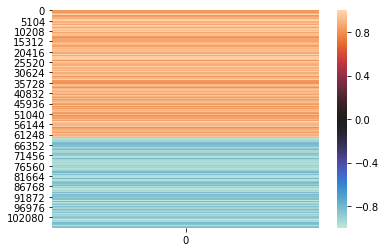

metacluster_0
activity pattern: [1]
metacluster_0 pattern_0
total seqlets: 2719
Task 0 hypothetical scores:


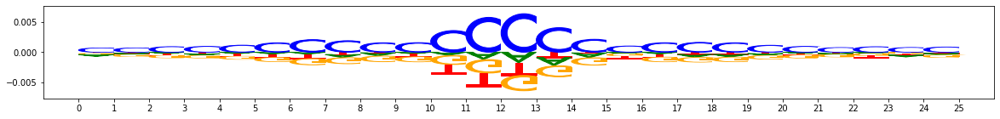

Task 0 actual importance scores:


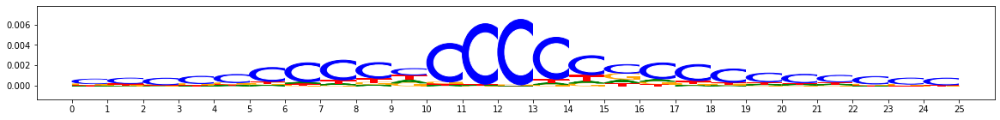

onehot, fwd and rev:


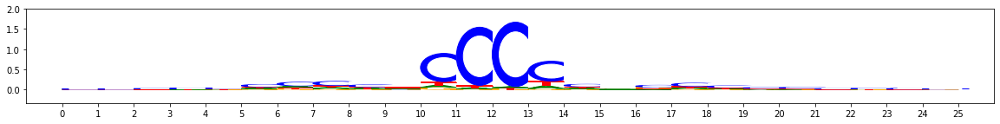

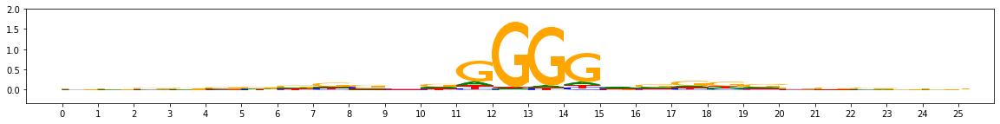

metacluster_0 pattern_1
total seqlets: 1749
Task 0 hypothetical scores:


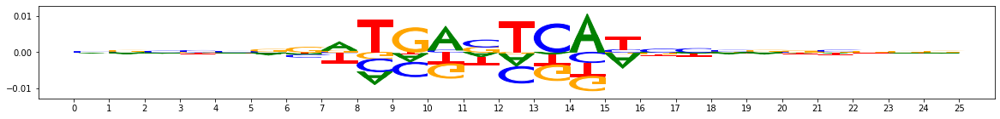

Task 0 actual importance scores:


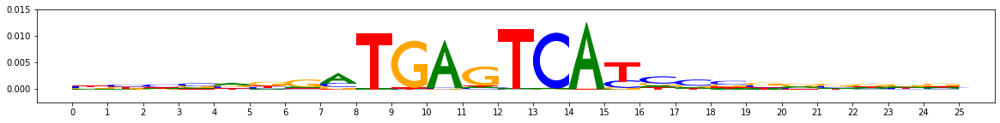

onehot, fwd and rev:


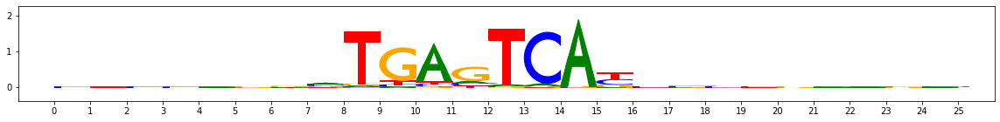

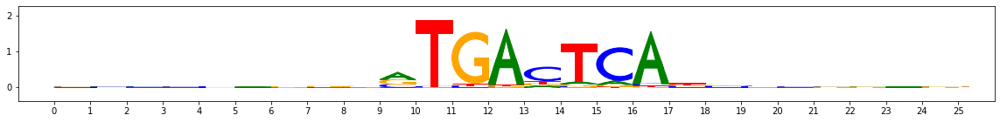

metacluster_0 pattern_2
total seqlets: 1025
Task 0 hypothetical scores:


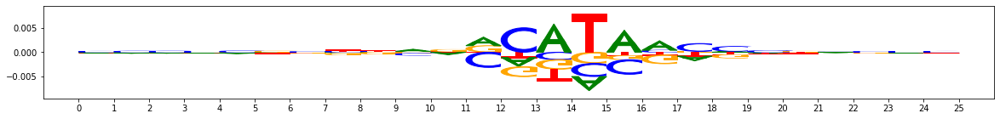

Task 0 actual importance scores:


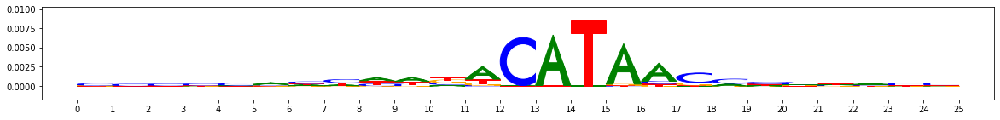

onehot, fwd and rev:


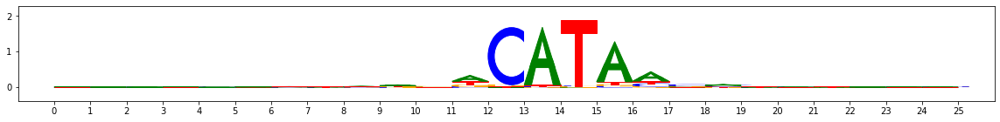

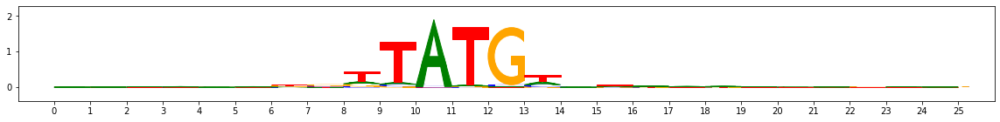

metacluster_0 pattern_3
total seqlets: 944
Task 0 hypothetical scores:


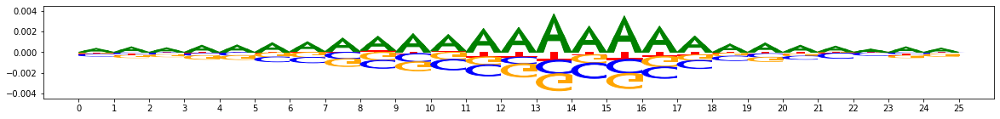

Task 0 actual importance scores:


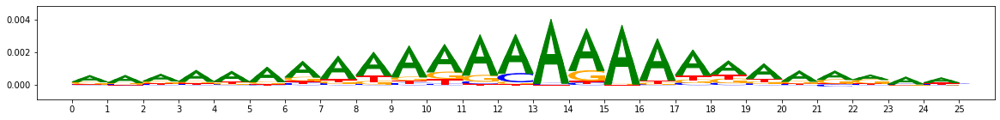

onehot, fwd and rev:


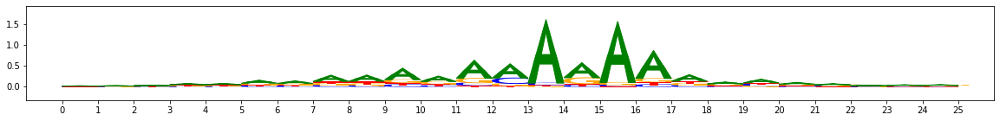

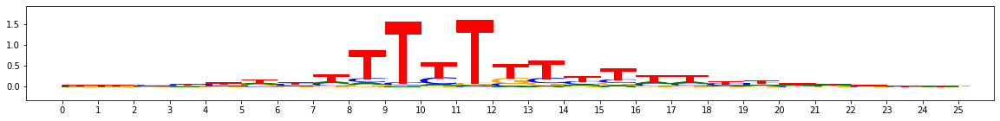

metacluster_0 pattern_4
total seqlets: 853
Task 0 hypothetical scores:


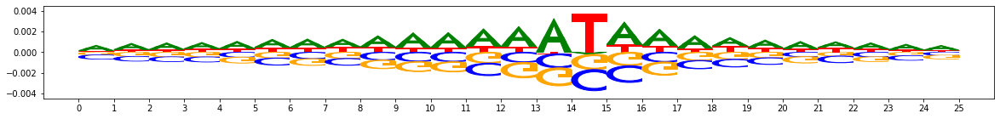

Task 0 actual importance scores:


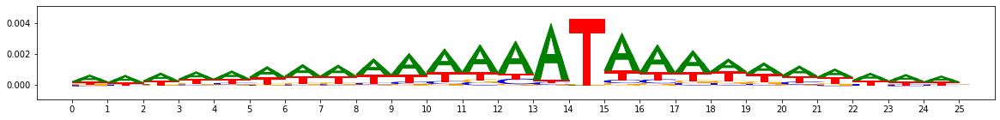

onehot, fwd and rev:


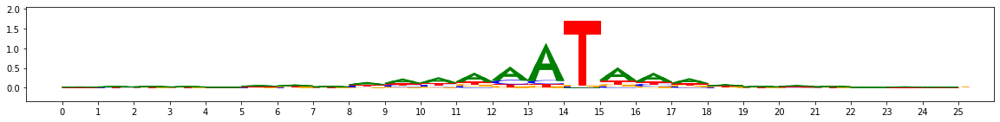

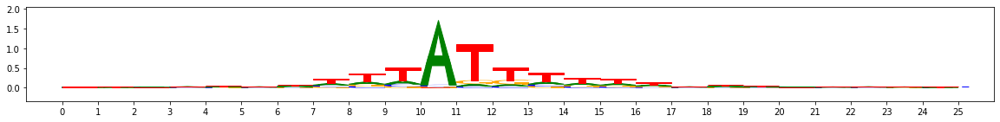

metacluster_0 pattern_5
total seqlets: 789
Task 0 hypothetical scores:


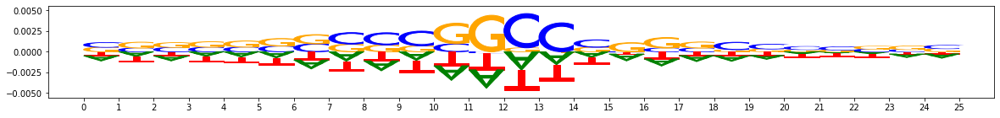

Task 0 actual importance scores:


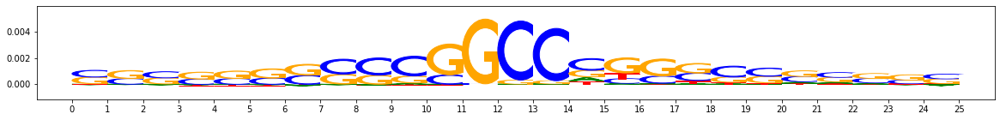

onehot, fwd and rev:


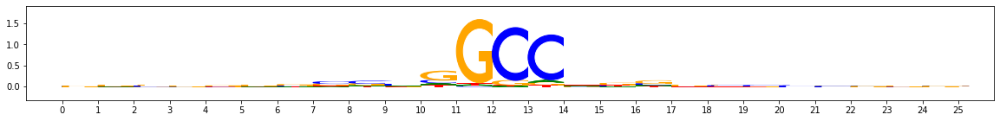

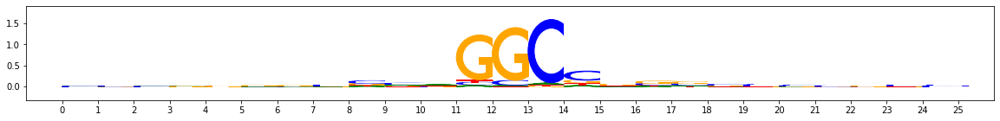

metacluster_0 pattern_6
total seqlets: 741
Task 0 hypothetical scores:


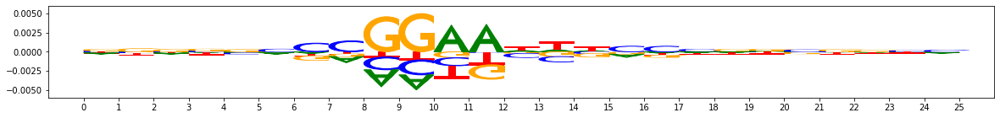

Task 0 actual importance scores:


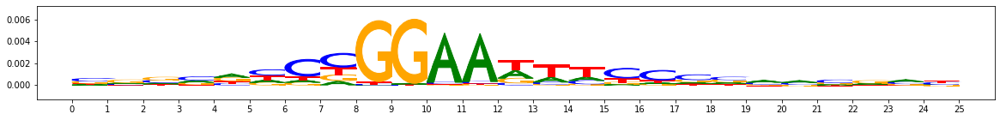

onehot, fwd and rev:


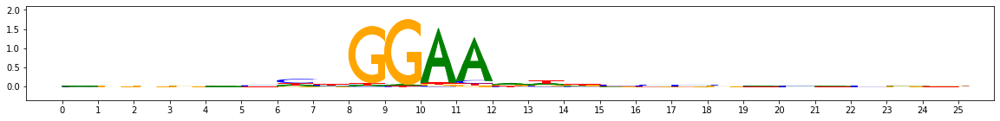

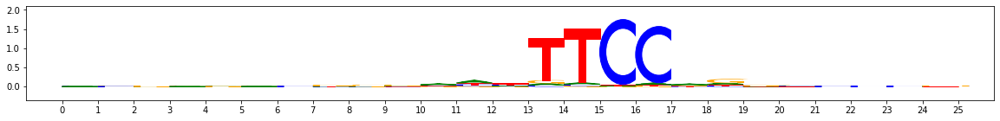

metacluster_0 pattern_7
total seqlets: 696
Task 0 hypothetical scores:


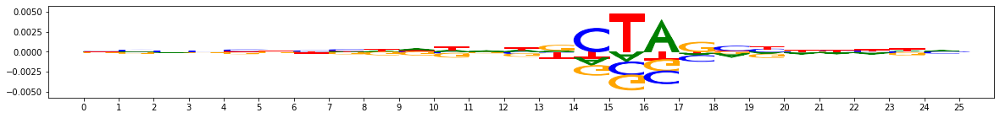

Task 0 actual importance scores:


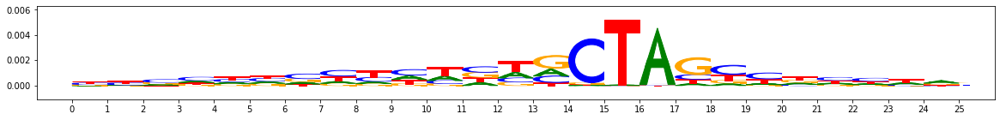

onehot, fwd and rev:


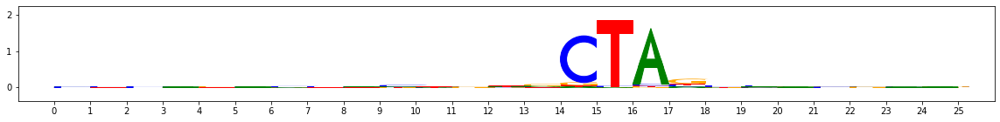

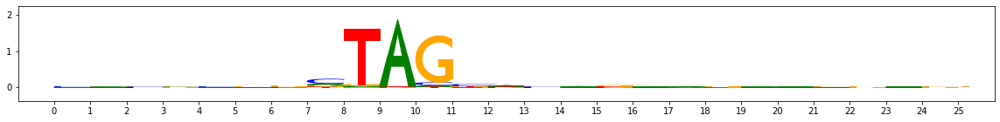

metacluster_0 pattern_8
total seqlets: 688
Task 0 hypothetical scores:


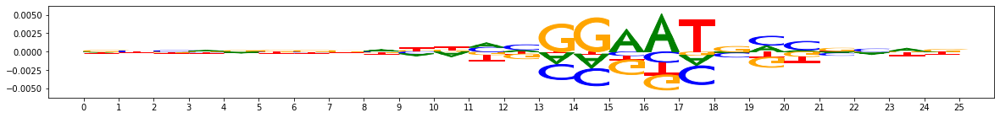

Task 0 actual importance scores:


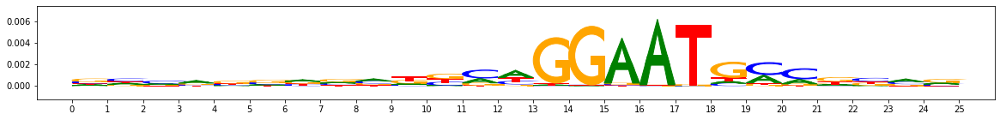

onehot, fwd and rev:


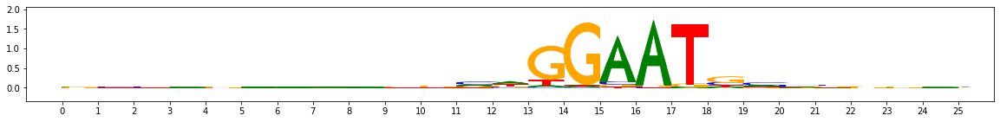

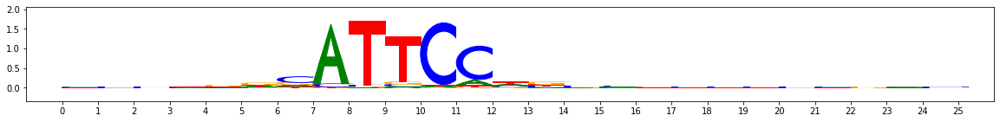

metacluster_0 pattern_9
total seqlets: 592
Task 0 hypothetical scores:


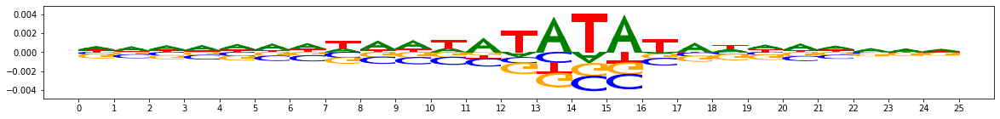

Task 0 actual importance scores:


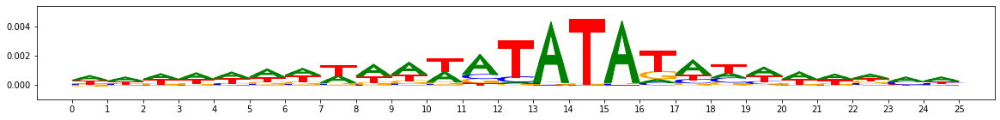

onehot, fwd and rev:


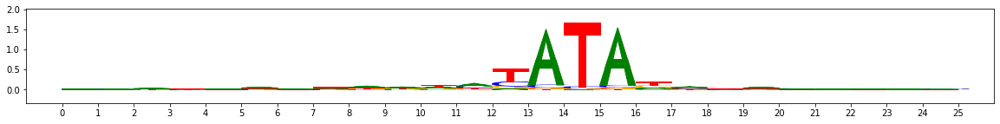

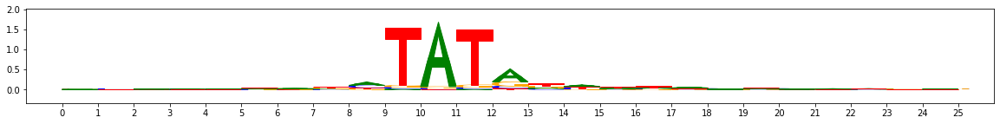

metacluster_0 pattern_10
total seqlets: 546
Task 0 hypothetical scores:


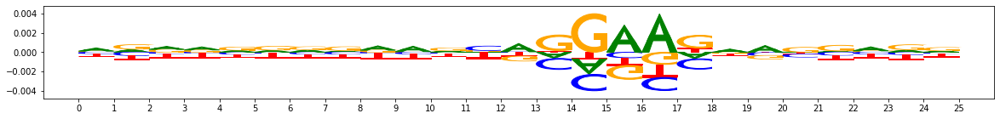

Task 0 actual importance scores:


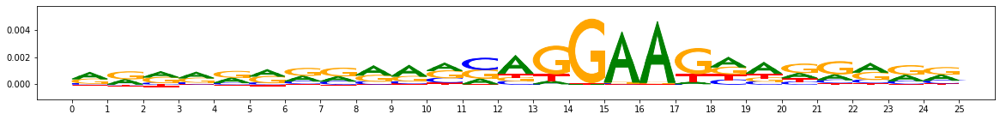

onehot, fwd and rev:


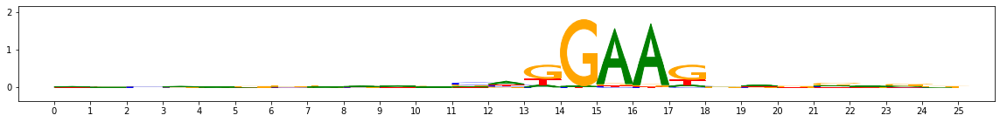

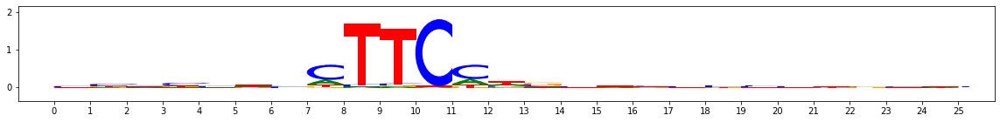

metacluster_0 pattern_11
total seqlets: 481
Task 0 hypothetical scores:


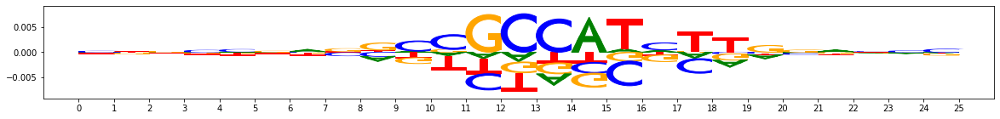

Task 0 actual importance scores:


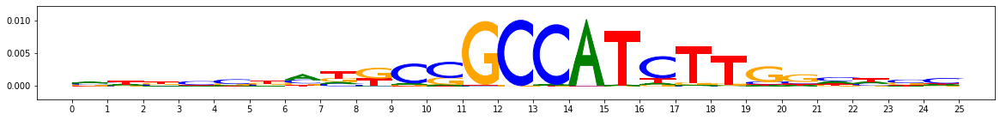

onehot, fwd and rev:


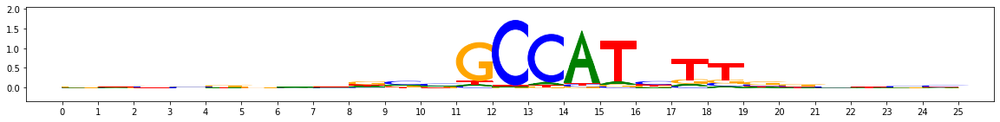

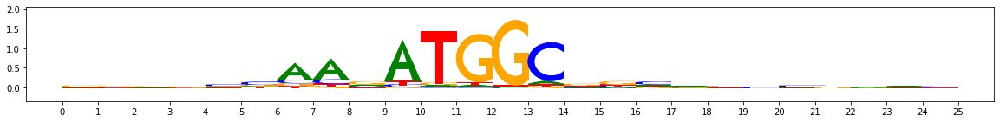

metacluster_0 pattern_12
total seqlets: 478
Task 0 hypothetical scores:


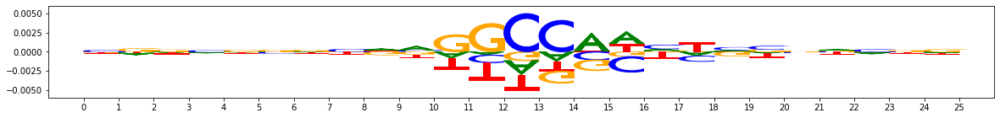

Task 0 actual importance scores:


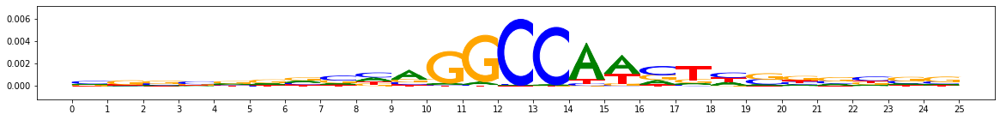

onehot, fwd and rev:


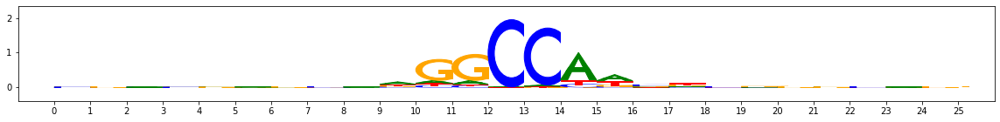

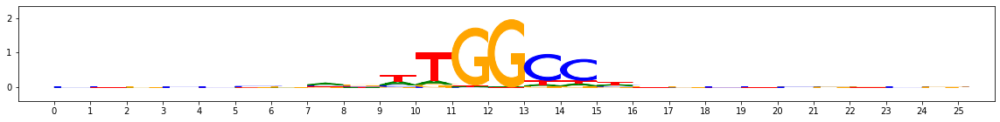

metacluster_0 pattern_13
total seqlets: 439
Task 0 hypothetical scores:


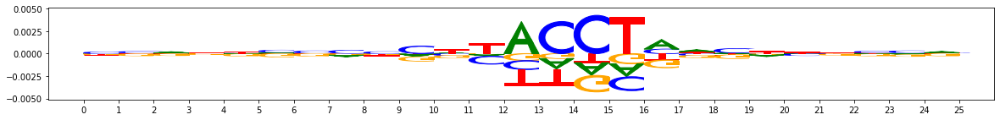

Task 0 actual importance scores:


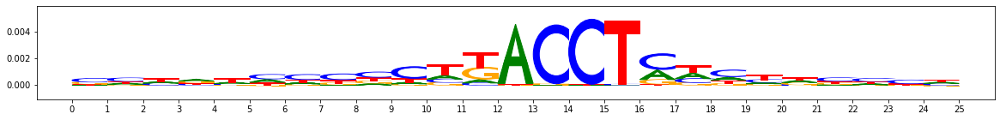

onehot, fwd and rev:


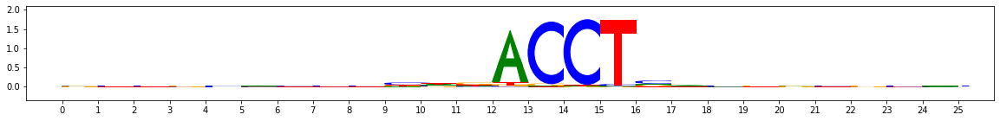

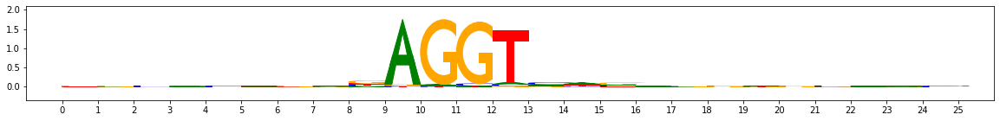

metacluster_0 pattern_14
total seqlets: 391
Task 0 hypothetical scores:


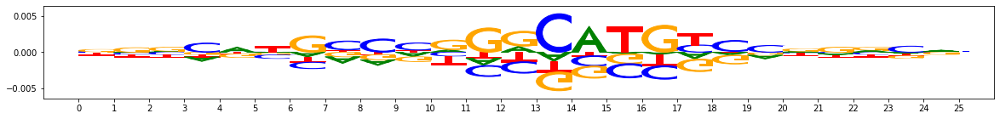

Task 0 actual importance scores:


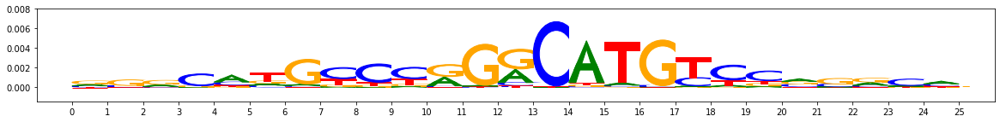

onehot, fwd and rev:


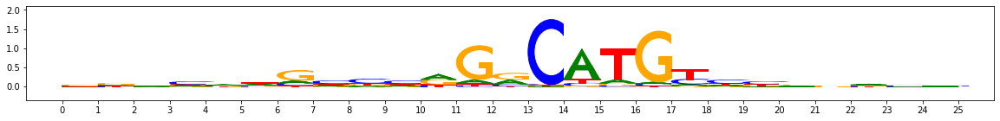

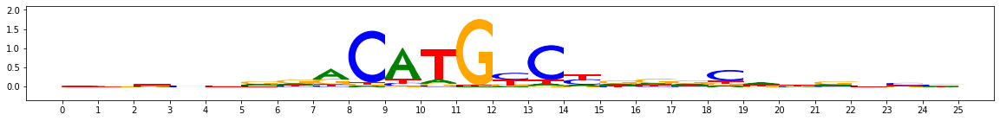

metacluster_0 pattern_15
total seqlets: 366
Task 0 hypothetical scores:


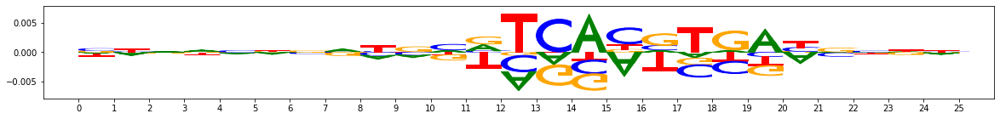

Task 0 actual importance scores:


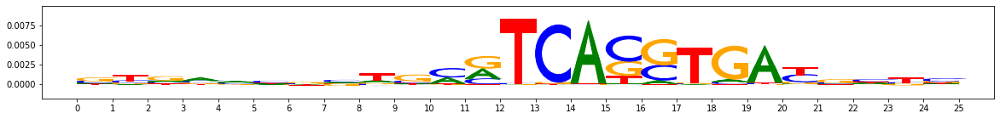

onehot, fwd and rev:


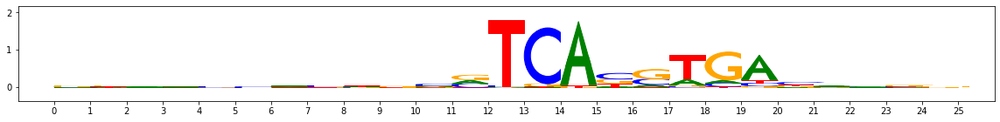

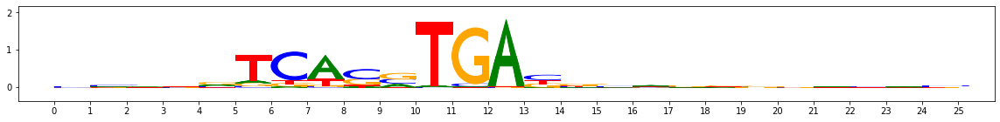

metacluster_0 pattern_16
total seqlets: 362
Task 0 hypothetical scores:


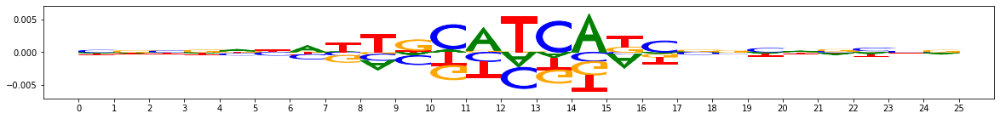

Task 0 actual importance scores:


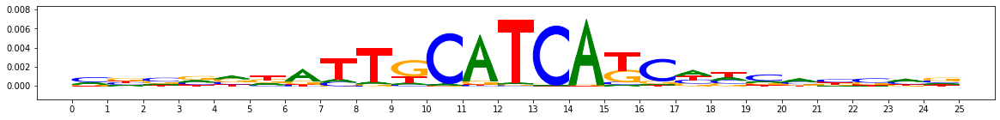

onehot, fwd and rev:


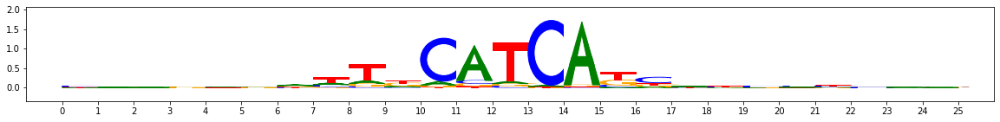

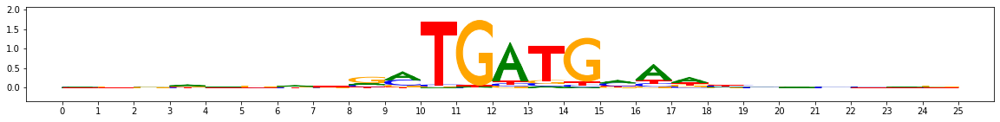

metacluster_0 pattern_17
total seqlets: 341
Task 0 hypothetical scores:


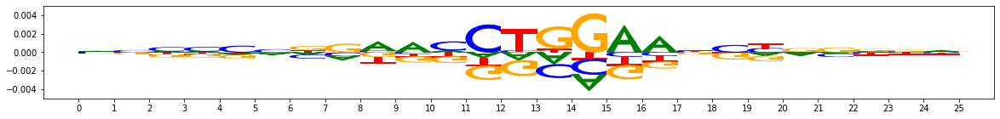

Task 0 actual importance scores:


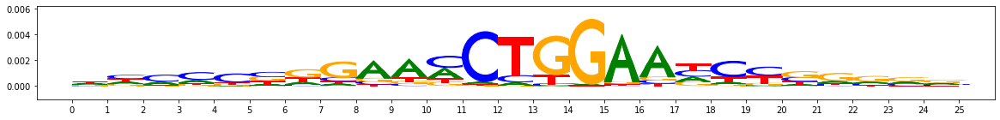

onehot, fwd and rev:


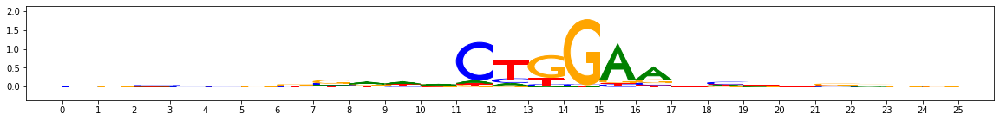

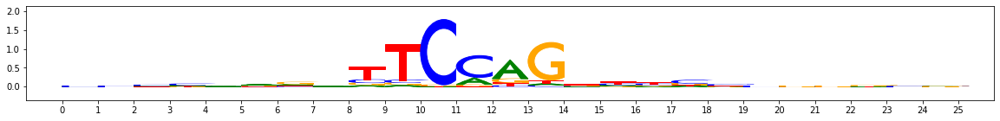

metacluster_0 pattern_18
total seqlets: 301
Task 0 hypothetical scores:


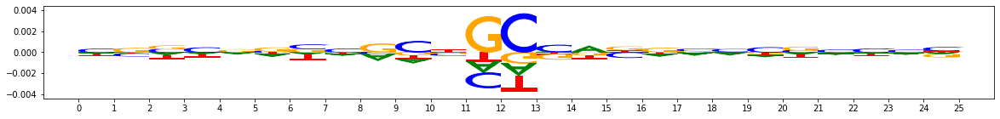

Task 0 actual importance scores:


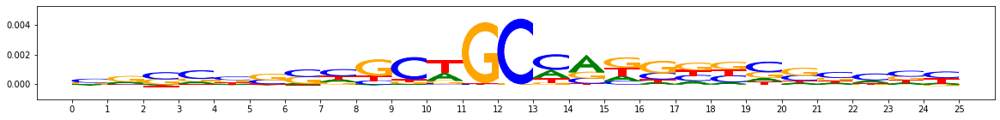

onehot, fwd and rev:


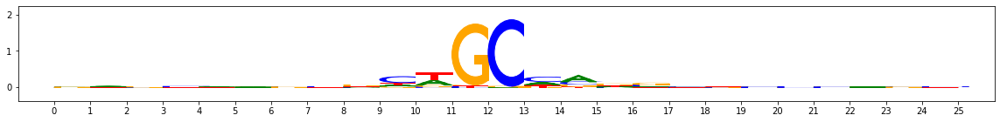

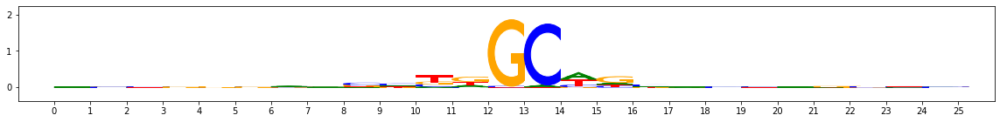

metacluster_0 pattern_19
total seqlets: 299
Task 0 hypothetical scores:


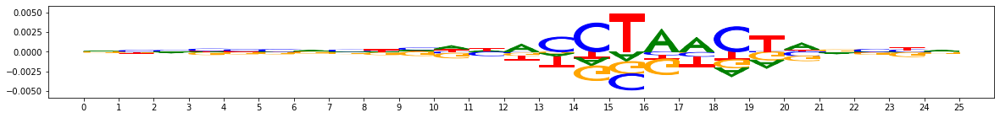

Task 0 actual importance scores:


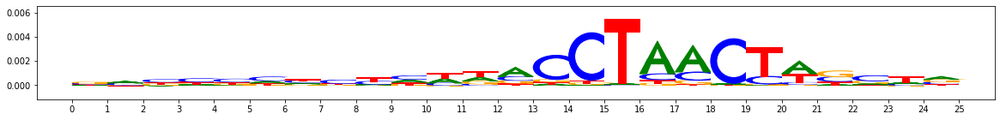

onehot, fwd and rev:


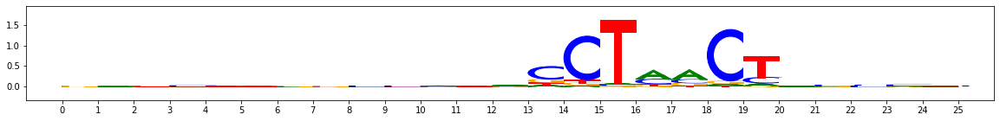

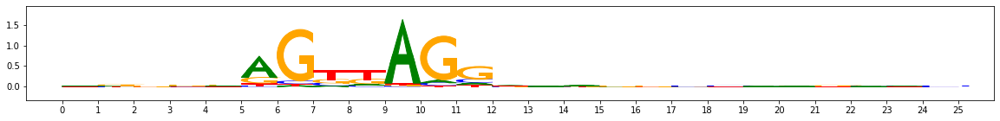

metacluster_0 pattern_20
total seqlets: 238
Task 0 hypothetical scores:


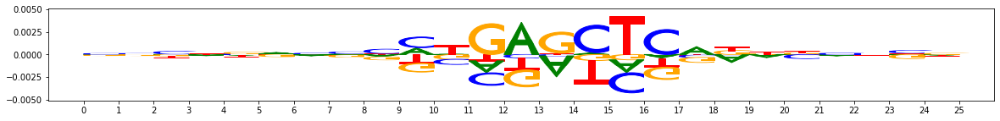

Task 0 actual importance scores:


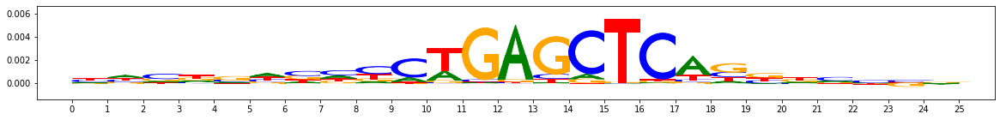

onehot, fwd and rev:


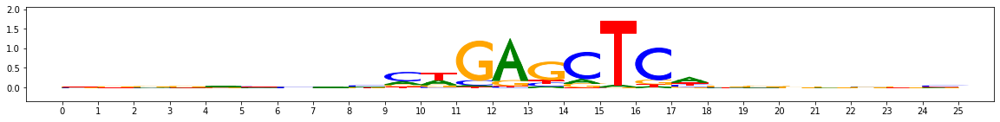

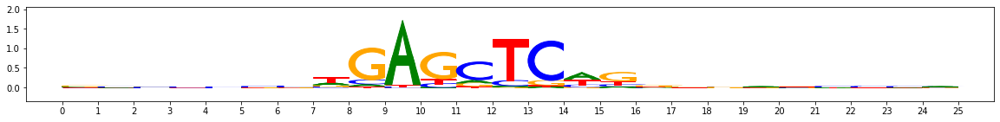

metacluster_0 pattern_21
total seqlets: 165
Task 0 hypothetical scores:


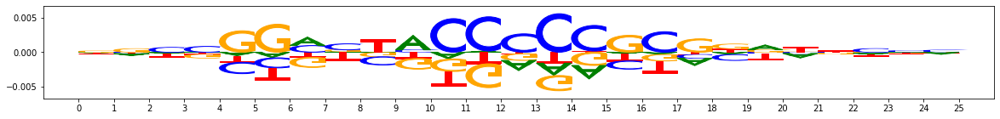

Task 0 actual importance scores:


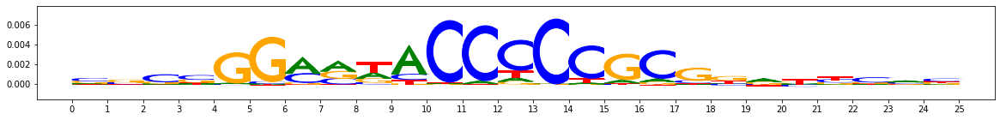

onehot, fwd and rev:


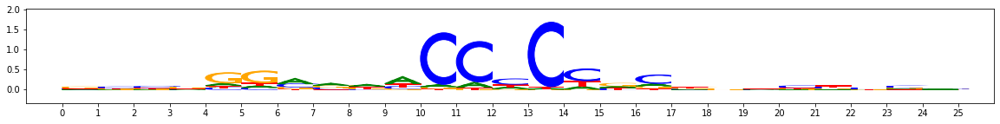

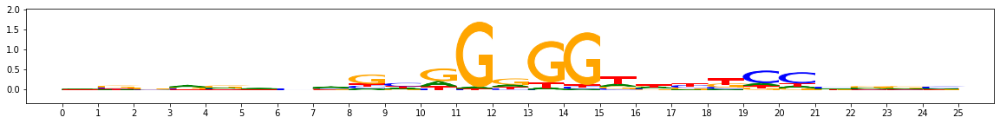

metacluster_0 pattern_22
total seqlets: 150
Task 0 hypothetical scores:


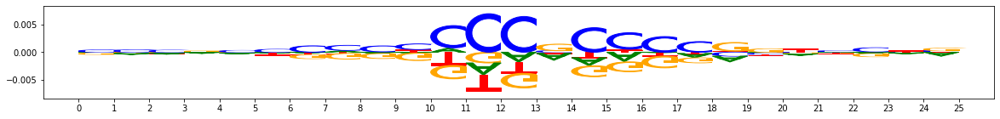

Task 0 actual importance scores:


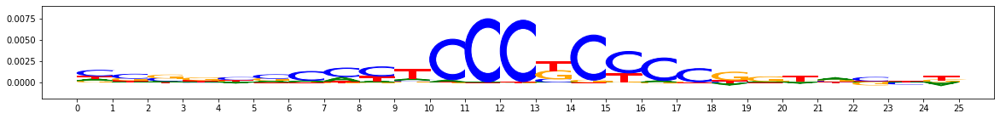

onehot, fwd and rev:


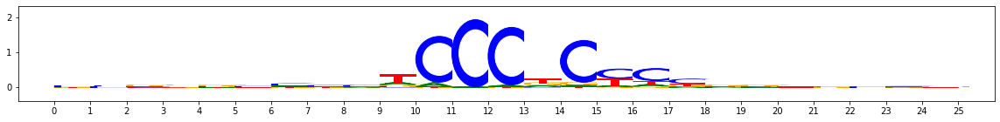

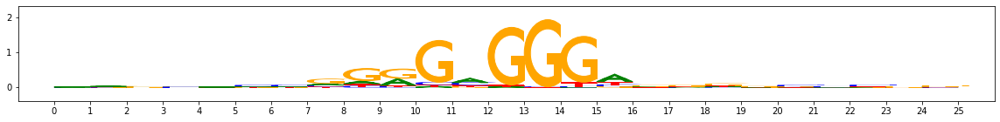

metacluster_0 pattern_23
total seqlets: 146
Task 0 hypothetical scores:


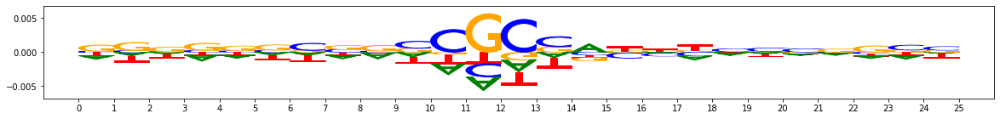

Task 0 actual importance scores:


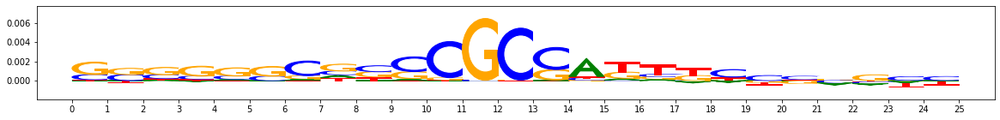

onehot, fwd and rev:


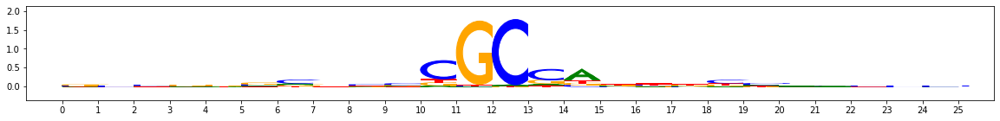

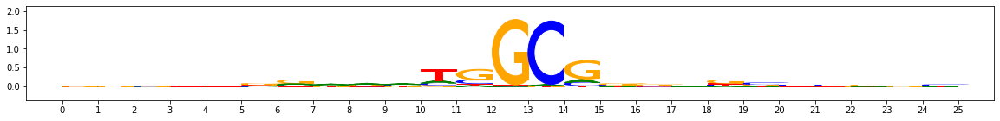

metacluster_0 pattern_24
total seqlets: 130
Task 0 hypothetical scores:


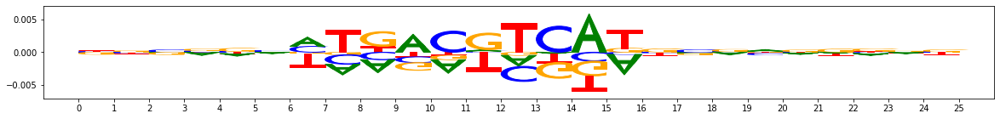

Task 0 actual importance scores:


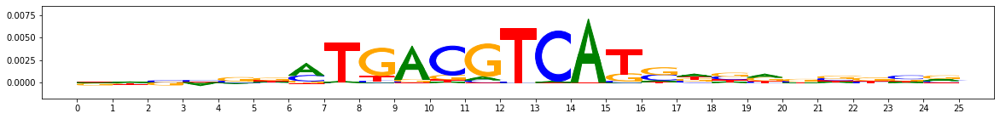

onehot, fwd and rev:


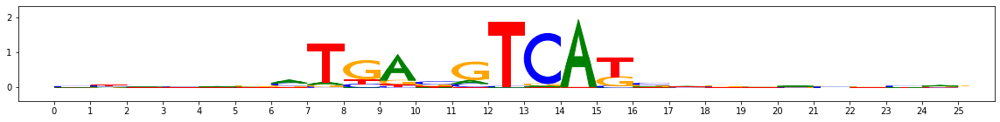

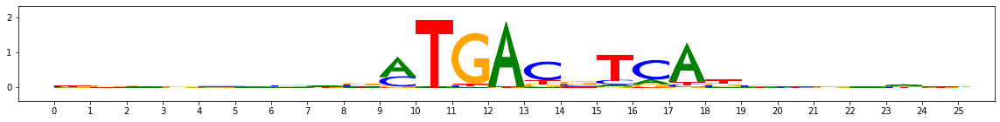

metacluster_0 pattern_25
total seqlets: 127
Task 0 hypothetical scores:


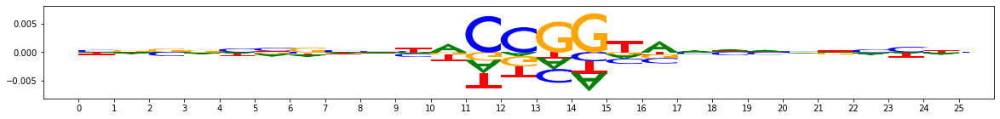

Task 0 actual importance scores:


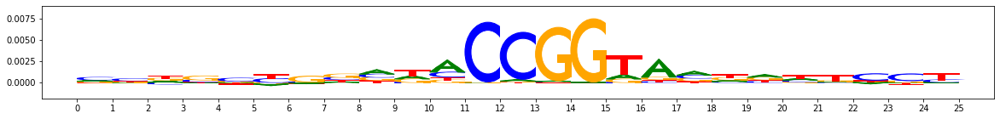

onehot, fwd and rev:


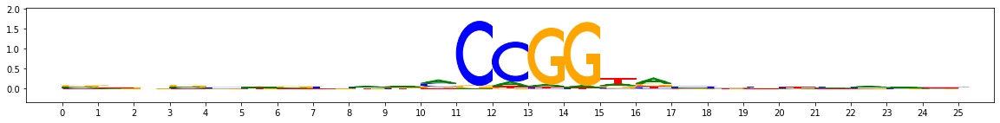

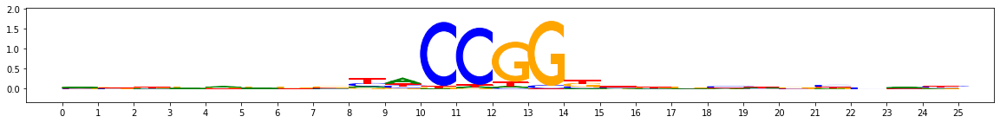

metacluster_0 pattern_26
total seqlets: 122
Task 0 hypothetical scores:


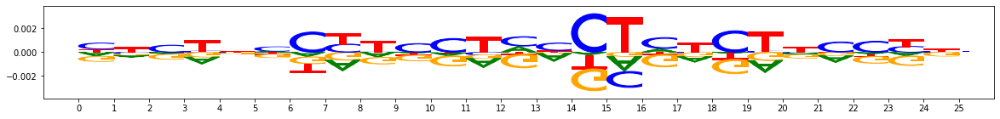

Task 0 actual importance scores:


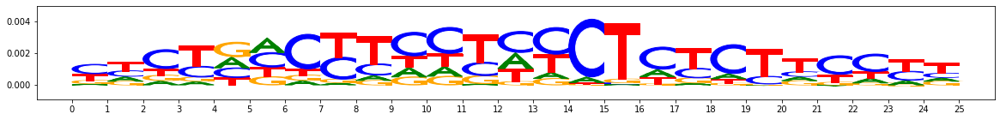

onehot, fwd and rev:


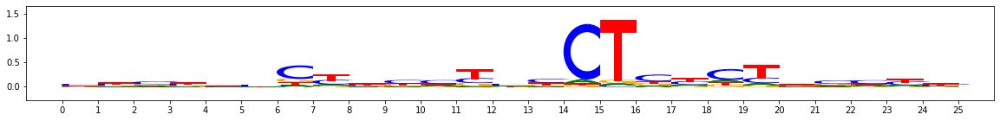

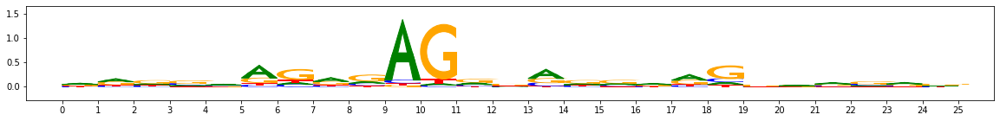

metacluster_0 pattern_27
total seqlets: 121
Task 0 hypothetical scores:


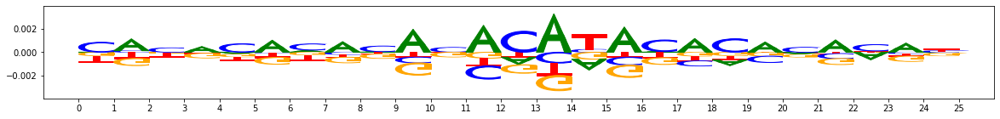

Task 0 actual importance scores:


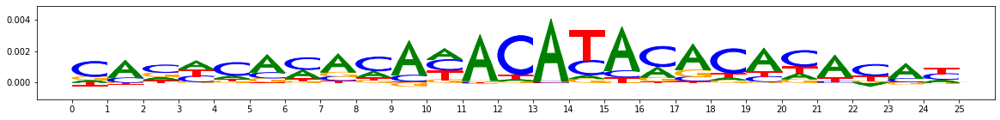

onehot, fwd and rev:


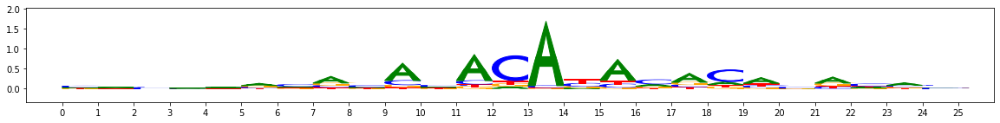

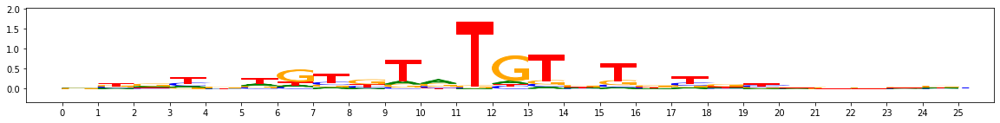

metacluster_0 pattern_28
total seqlets: 99
Task 0 hypothetical scores:


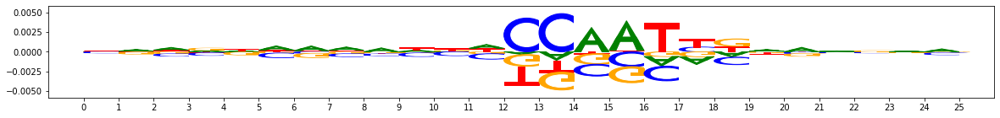

Task 0 actual importance scores:


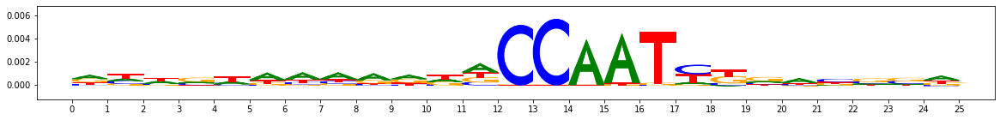

onehot, fwd and rev:


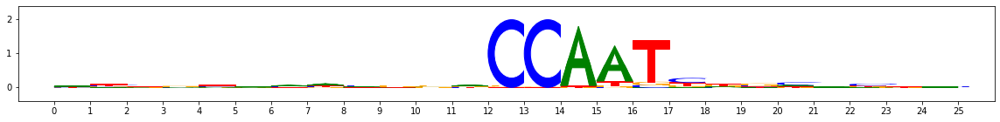

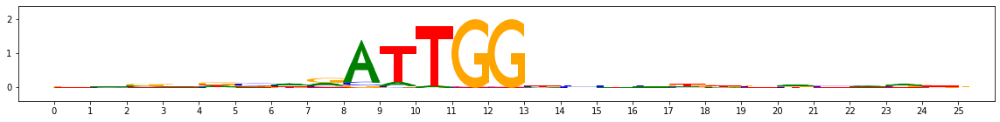

metacluster_0 pattern_29
total seqlets: 82
Task 0 hypothetical scores:


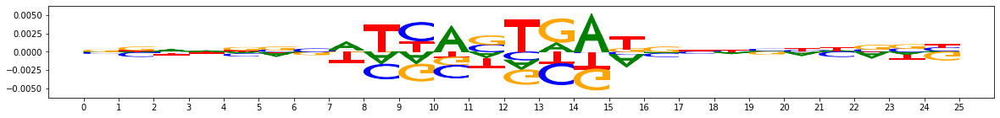

Task 0 actual importance scores:


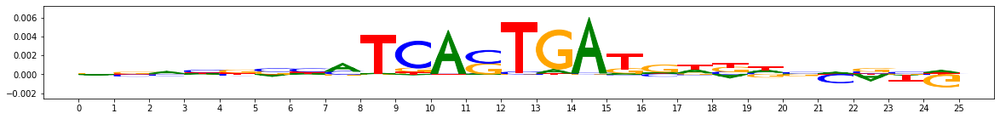

onehot, fwd and rev:


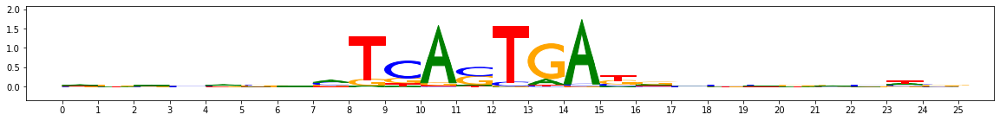

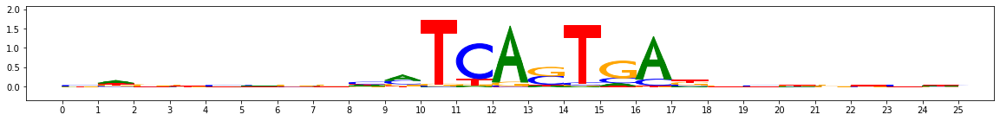

metacluster_0 pattern_30
total seqlets: 75
Task 0 hypothetical scores:


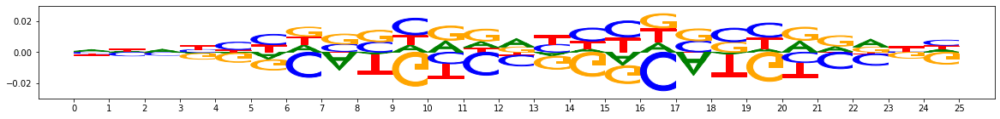

Task 0 actual importance scores:


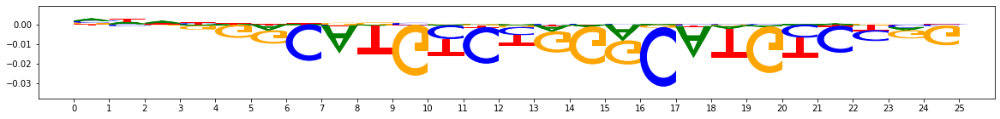

onehot, fwd and rev:


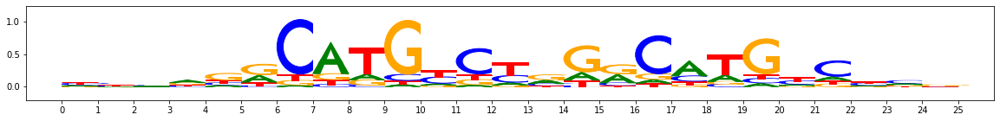

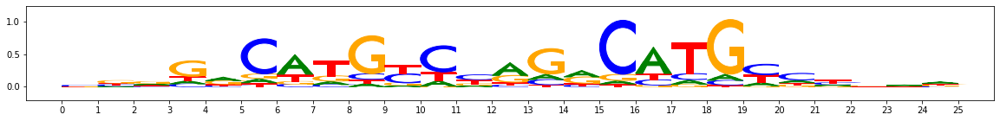

metacluster_0 pattern_31
total seqlets: 63
Task 0 hypothetical scores:


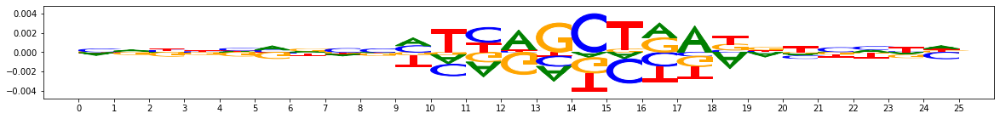

Task 0 actual importance scores:


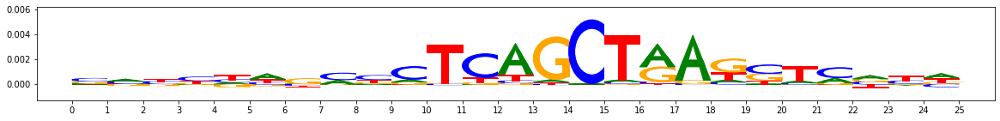

onehot, fwd and rev:


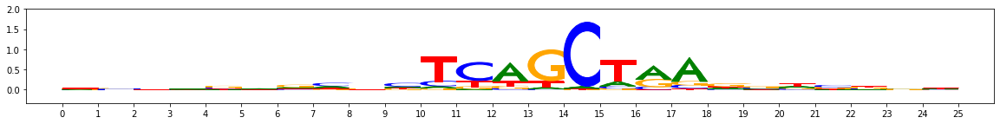

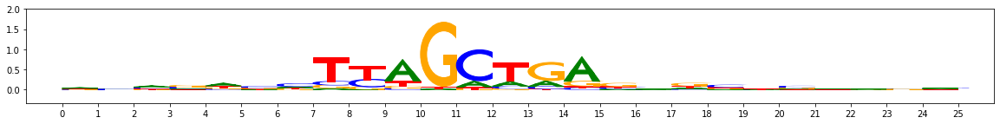

metacluster_0 pattern_32
total seqlets: 41
Task 0 hypothetical scores:


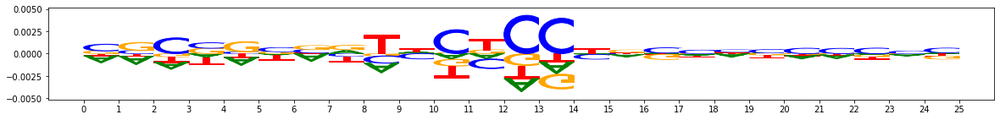

Task 0 actual importance scores:


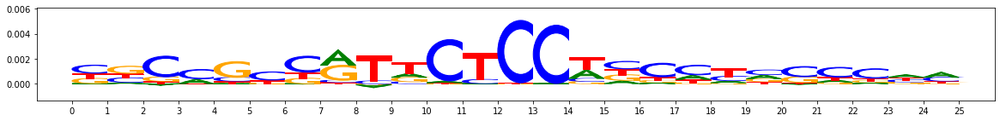

onehot, fwd and rev:


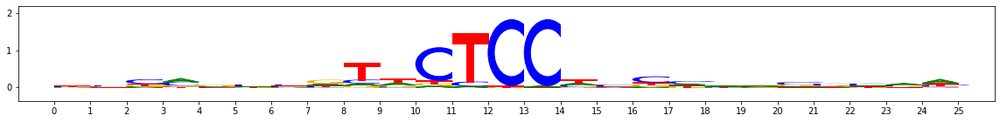

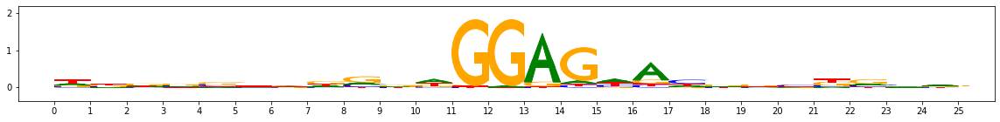

metacluster_0 pattern_33
total seqlets: 34
Task 0 hypothetical scores:


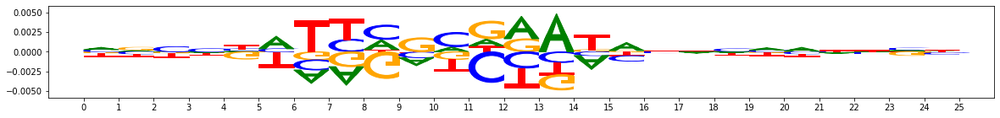

Task 0 actual importance scores:


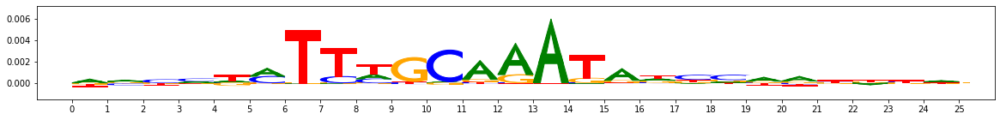

onehot, fwd and rev:


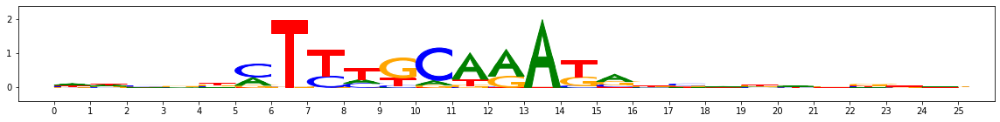

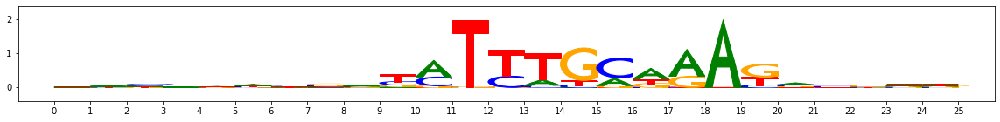

metacluster_0 pattern_34
total seqlets: 30
Task 0 hypothetical scores:


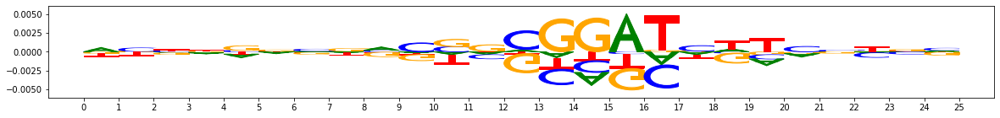

Task 0 actual importance scores:


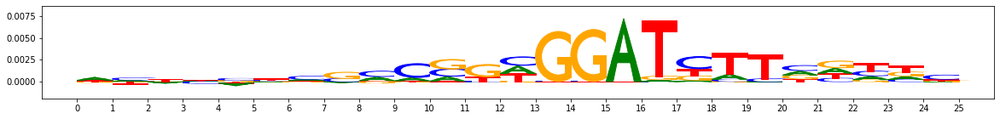

onehot, fwd and rev:


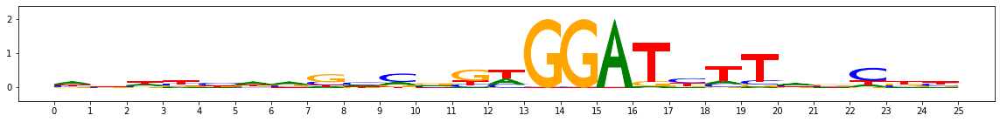

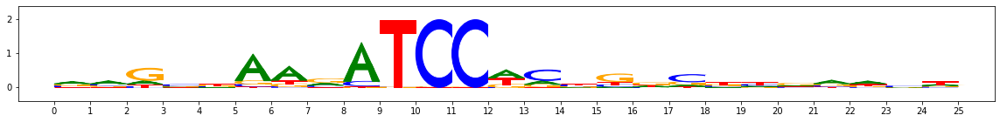

metacluster_0 pattern_35
total seqlets: 28
Task 0 hypothetical scores:


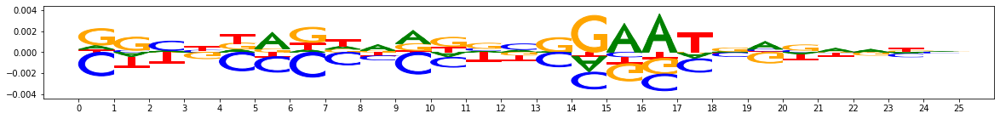

Task 0 actual importance scores:


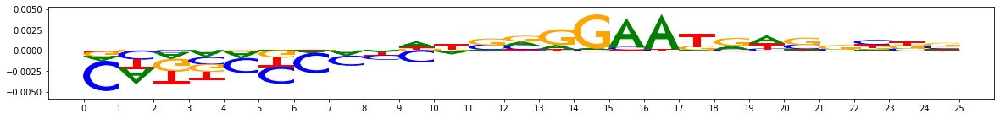

onehot, fwd and rev:


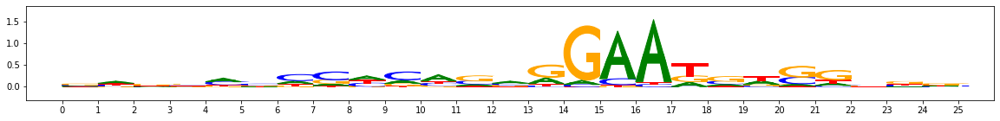

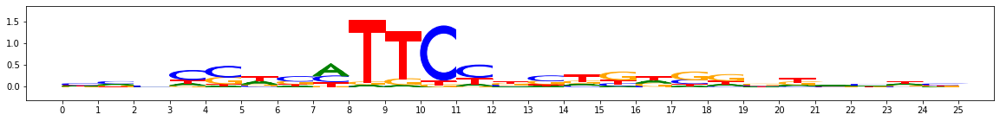

metacluster_0 pattern_36
total seqlets: 25
Task 0 hypothetical scores:


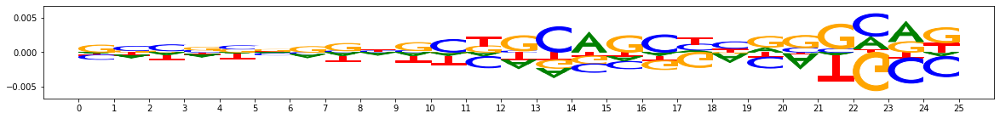

Task 0 actual importance scores:


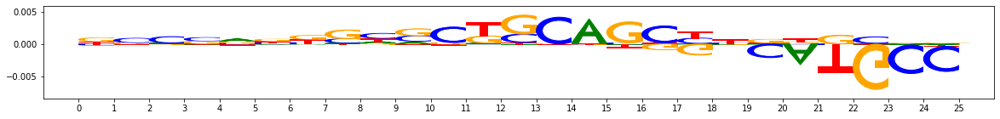

onehot, fwd and rev:


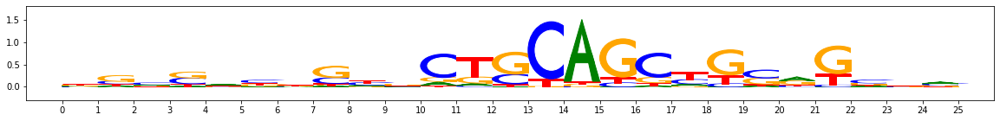

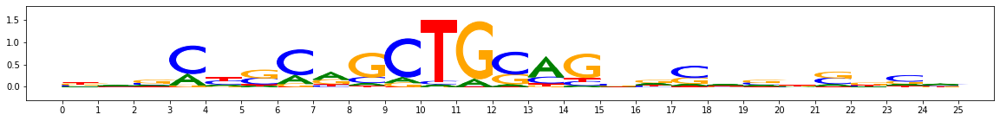

metacluster_0 pattern_37
total seqlets: 23
Task 0 hypothetical scores:


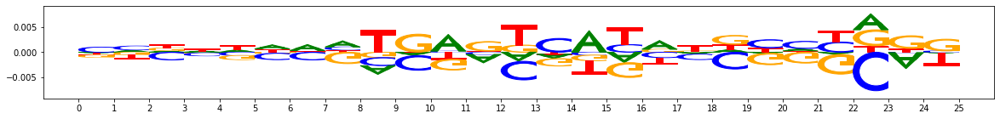

Task 0 actual importance scores:


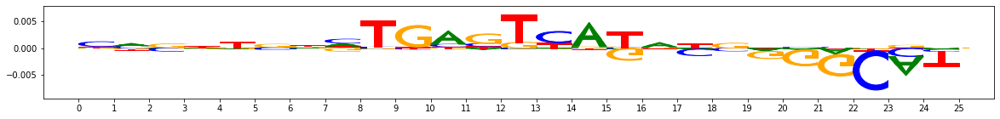

onehot, fwd and rev:


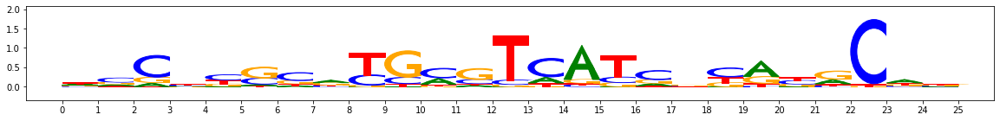

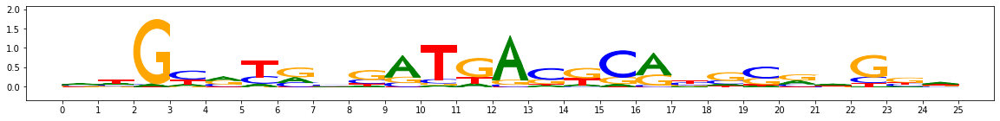

metacluster_1
activity pattern: [-1]


In [ ]:
inspect_motifs(output_file, onehot_data, task_num=0, activity_pattern_to_plot=1)

In [ ]:
meme_output = f'../data/output_data/A549_rep1rep2.meme'
output_meme(output_file, onehot_data, activity_pattern_to_plot=1, meme_output=meme_output)

metacluster_0
activity pattern: [1]
metacluster_0 pattern_0
total seqlets: 2719
metacluster_0 pattern_1
total seqlets: 1749
metacluster_0 pattern_2
total seqlets: 1025
metacluster_0 pattern_3
total seqlets: 944
metacluster_0 pattern_4
total seqlets: 853
metacluster_0 pattern_5
total seqlets: 789
metacluster_0 pattern_6
total seqlets: 741
metacluster_0 pattern_7
total seqlets: 696
metacluster_0 pattern_8
total seqlets: 688
metacluster_0 pattern_9
total seqlets: 592
metacluster_0 pattern_10
total seqlets: 546
metacluster_0 pattern_11
total seqlets: 481
metacluster_0 pattern_12
total seqlets: 478
metacluster_0 pattern_13
total seqlets: 439
metacluster_0 pattern_14
total seqlets: 391
metacluster_0 pattern_15
total seqlets: 366
metacluster_0 pattern_16
total seqlets: 362
metacluster_0 pattern_17
total seqlets: 341
metacluster_0 pattern_18
total seqlets: 301
metacluster_0 pattern_19
total seqlets: 299
metacluster_0 pattern_20
total seqlets: 238
metacluster_0 pattern_21
total seqlets: 165
met

In [ ]:
cell_line = 'A549'
output_file = f'../data/output_data/A549_rep1rep2_regression.h5'
input_file = f'../data/output_data/starr_sig_valueLabel_499bp_rep1rep2.fa'

In [ ]:
records = list(SeqIO.parse(input_file, "fasta"))
fasta_sequences = [str(record.seq.upper()) for record in records]
onehot_data = np.array([one_hot_encode_along_channel_axis(seq)[start_bp: end_bp] for seq in fasta_sequences])

Metaclusters heatmap


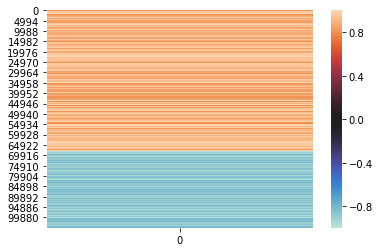

metacluster_0
activity pattern: [1]
metacluster_0 pattern_0
total seqlets: 2297
Task 0 hypothetical scores:


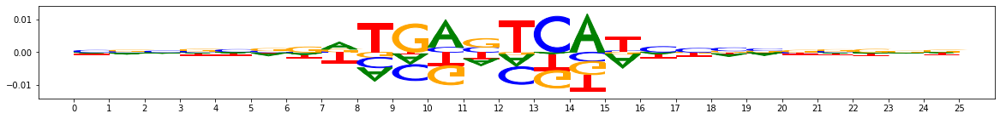

Task 0 actual importance scores:


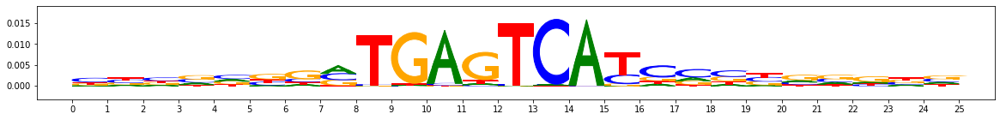

onehot, fwd and rev:


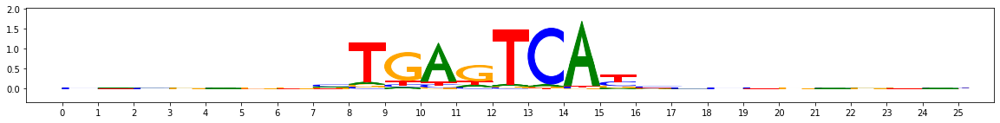

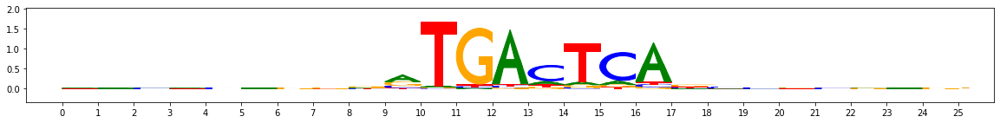

metacluster_0 pattern_1
total seqlets: 1438
Task 0 hypothetical scores:


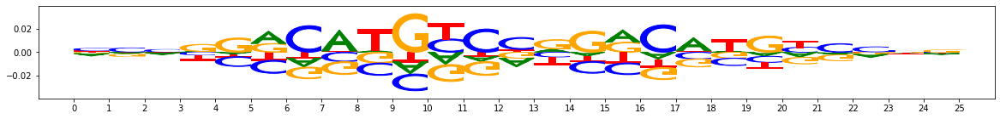

Task 0 actual importance scores:


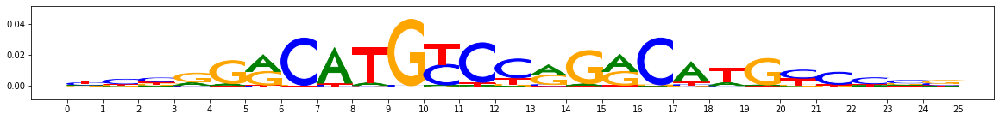

onehot, fwd and rev:


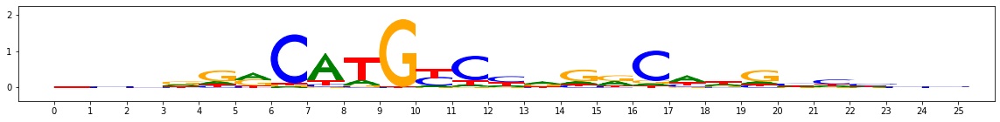

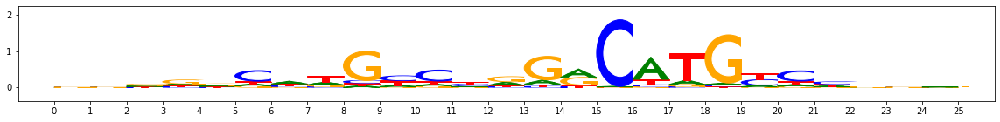

metacluster_0 pattern_2
total seqlets: 1023
Task 0 hypothetical scores:


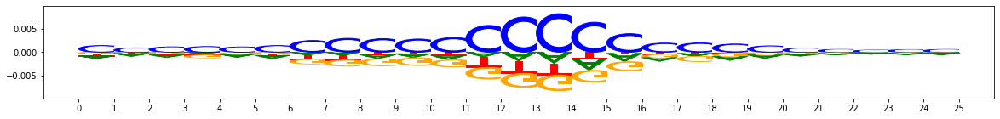

Task 0 actual importance scores:


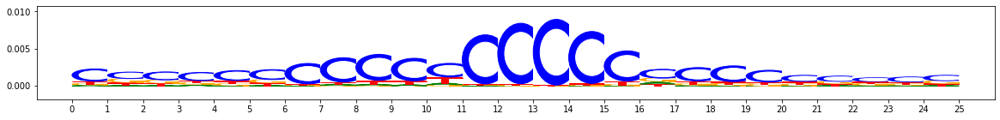

onehot, fwd and rev:


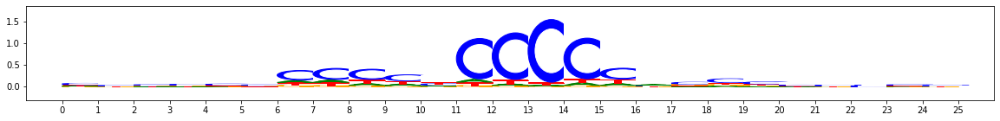

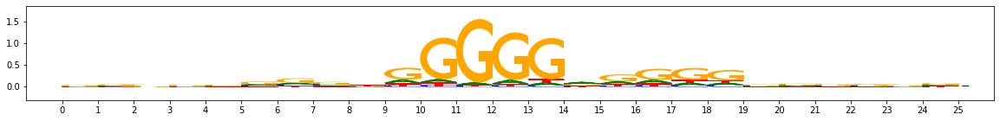

metacluster_0 pattern_3
total seqlets: 869
Task 0 hypothetical scores:


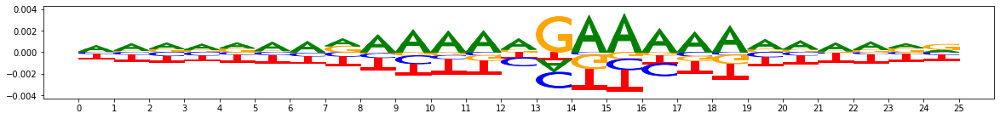

Task 0 actual importance scores:


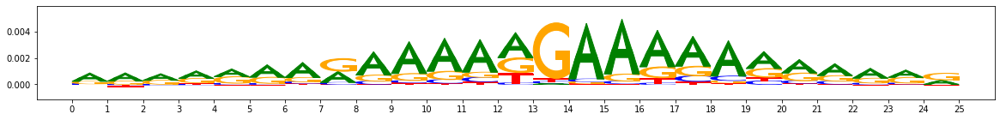

onehot, fwd and rev:


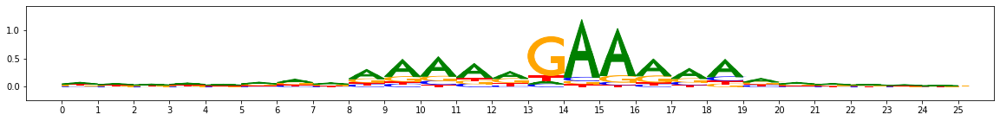

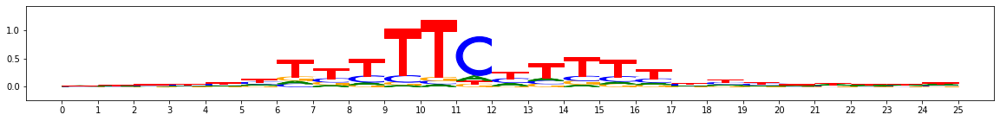

metacluster_0 pattern_4
total seqlets: 729
Task 0 hypothetical scores:


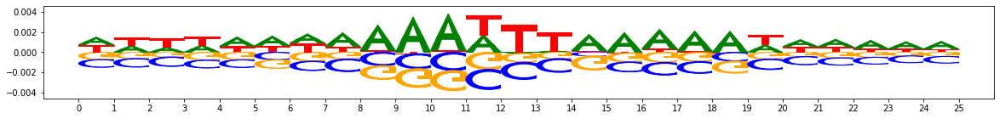

Task 0 actual importance scores:


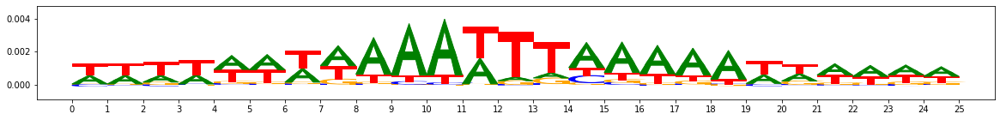

onehot, fwd and rev:


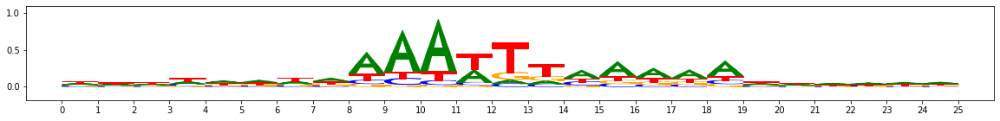

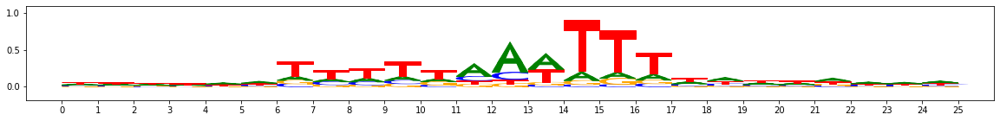

metacluster_0 pattern_5
total seqlets: 619
Task 0 hypothetical scores:


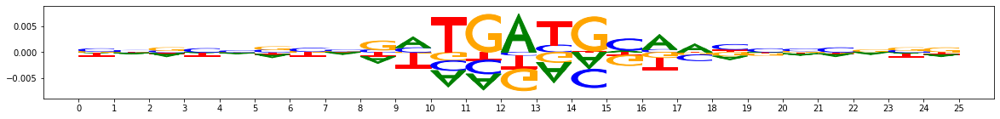

Task 0 actual importance scores:


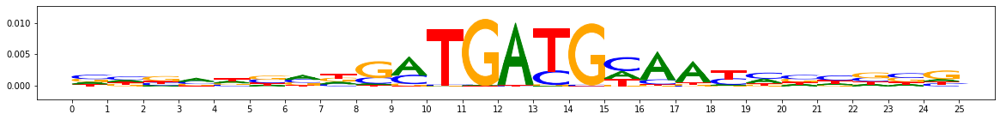

onehot, fwd and rev:


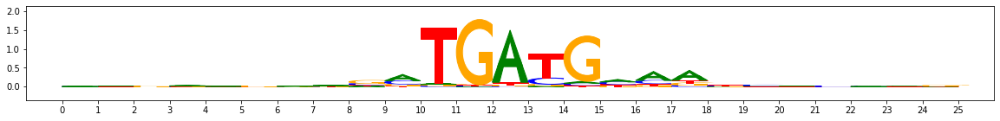

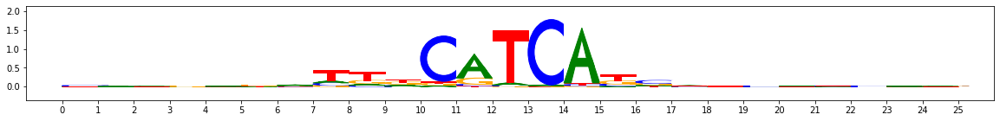

metacluster_0 pattern_6
total seqlets: 611
Task 0 hypothetical scores:


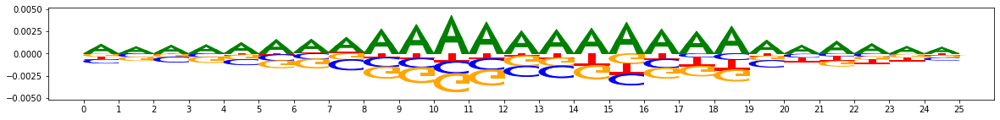

Task 0 actual importance scores:


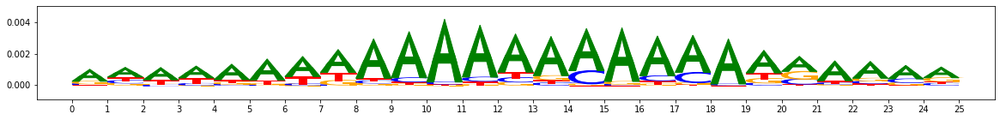

onehot, fwd and rev:


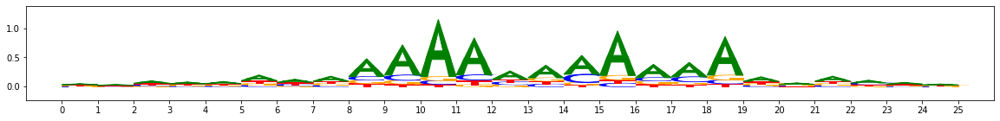

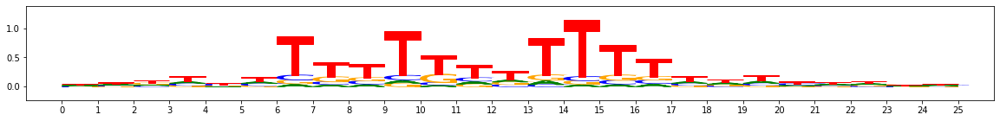

metacluster_0 pattern_7
total seqlets: 521
Task 0 hypothetical scores:


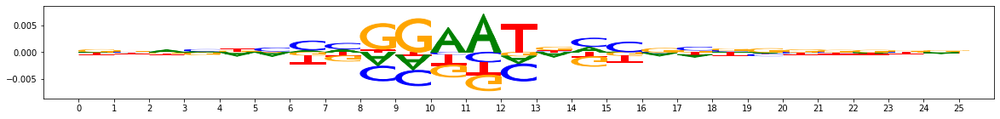

Task 0 actual importance scores:


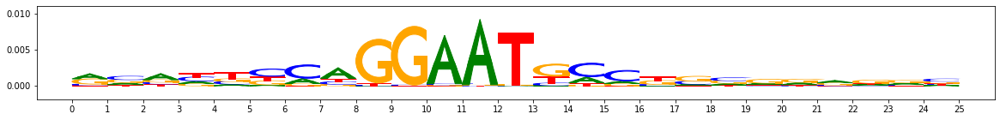

onehot, fwd and rev:


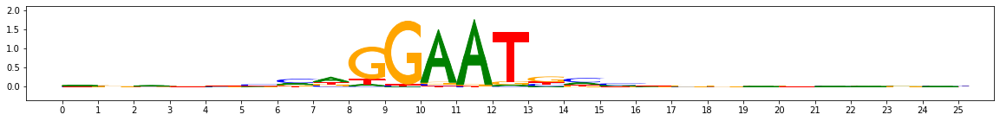

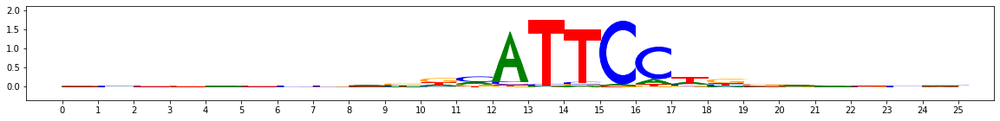

metacluster_0 pattern_8
total seqlets: 491
Task 0 hypothetical scores:


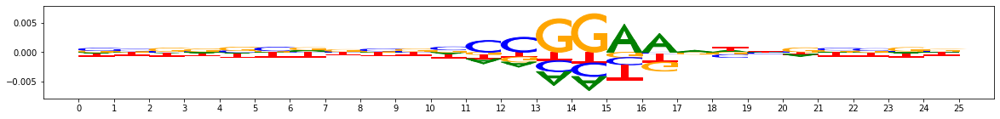

Task 0 actual importance scores:


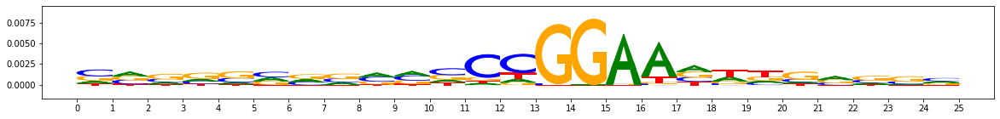

onehot, fwd and rev:


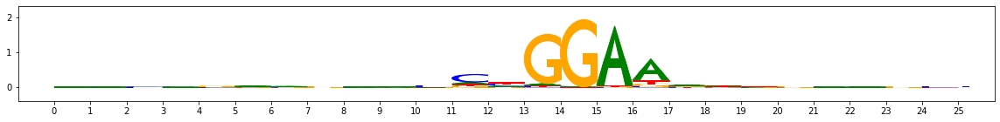

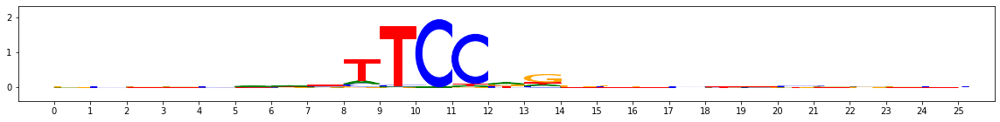

metacluster_0 pattern_9
total seqlets: 479
Task 0 hypothetical scores:


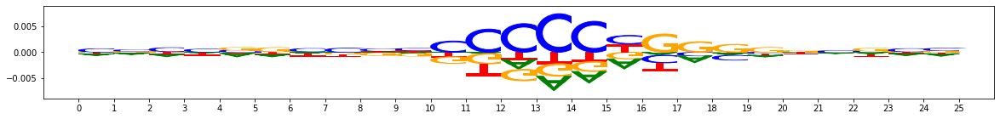

Task 0 actual importance scores:


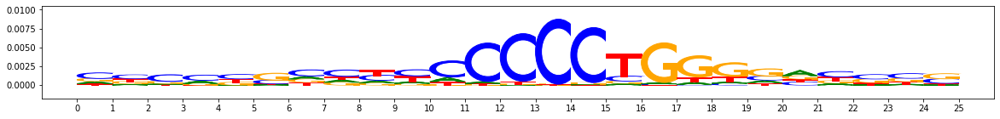

onehot, fwd and rev:


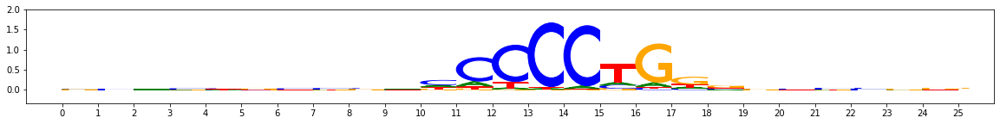

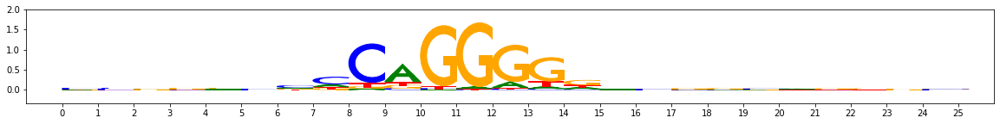

metacluster_0 pattern_10
total seqlets: 435
Task 0 hypothetical scores:


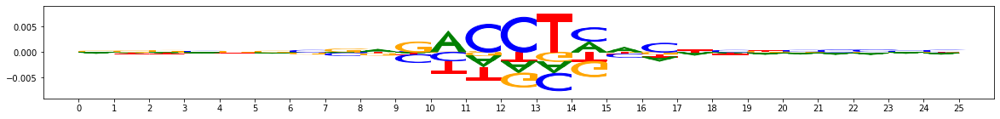

Task 0 actual importance scores:


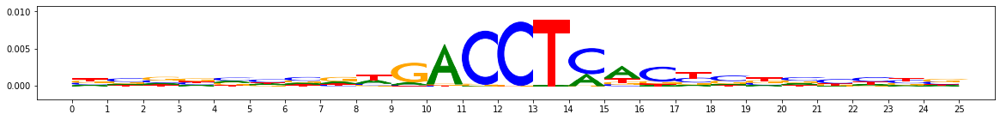

onehot, fwd and rev:


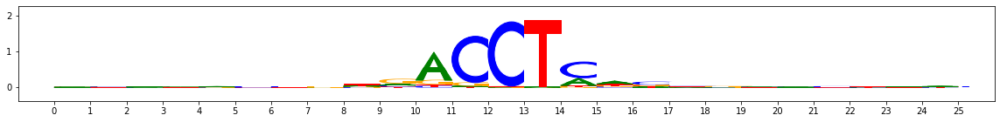

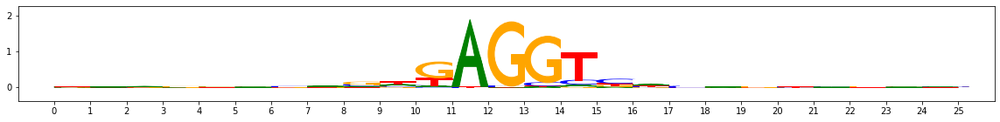

metacluster_0 pattern_11
total seqlets: 418
Task 0 hypothetical scores:


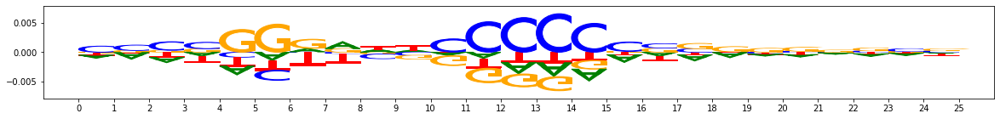

Task 0 actual importance scores:


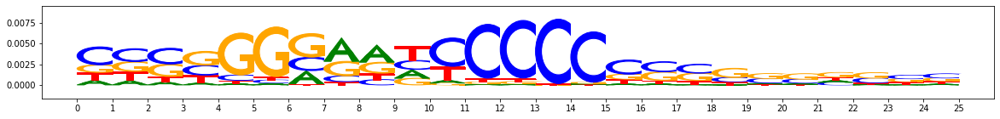

onehot, fwd and rev:


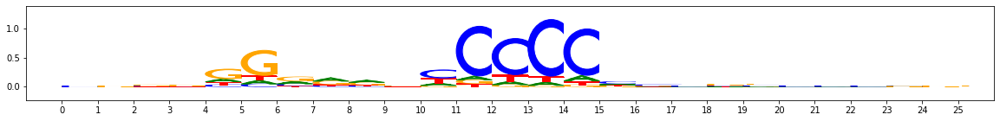

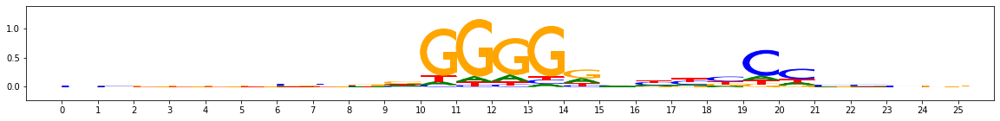

metacluster_0 pattern_12
total seqlets: 386
Task 0 hypothetical scores:


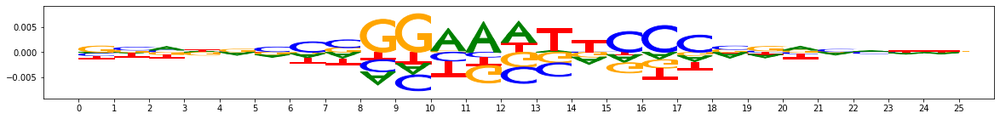

Task 0 actual importance scores:


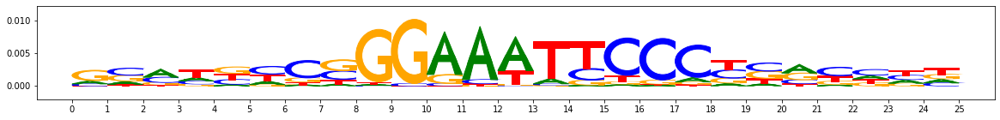

onehot, fwd and rev:


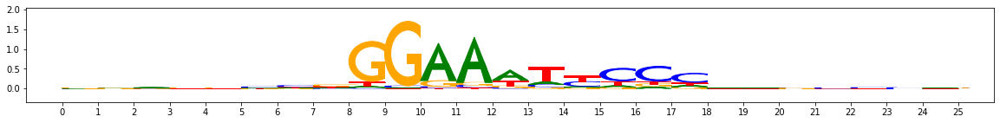

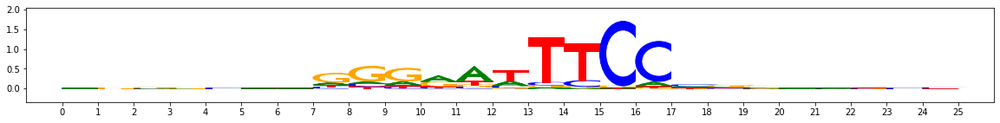

metacluster_0 pattern_13
total seqlets: 351
Task 0 hypothetical scores:


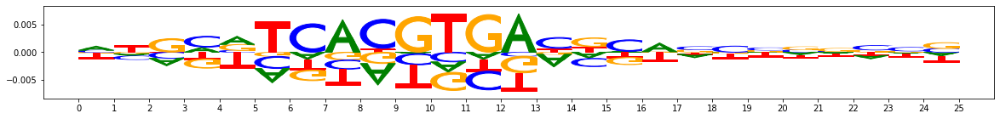

Task 0 actual importance scores:


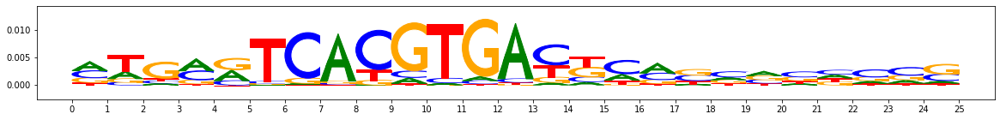

onehot, fwd and rev:


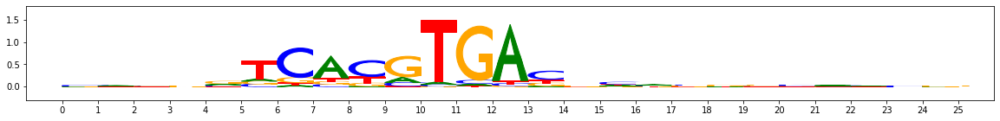

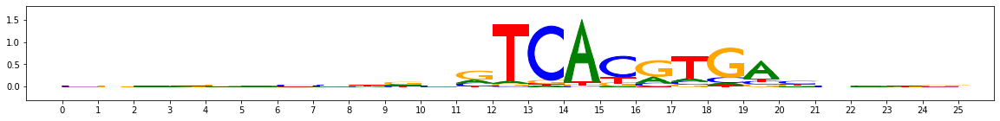

metacluster_0 pattern_14
total seqlets: 348
Task 0 hypothetical scores:


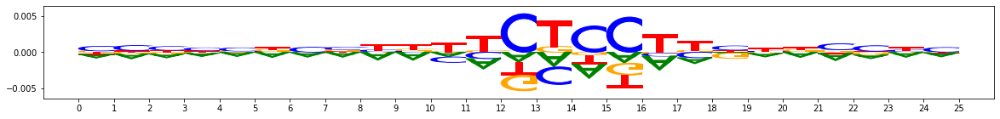

Task 0 actual importance scores:


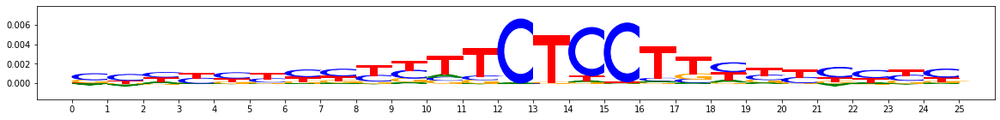

onehot, fwd and rev:


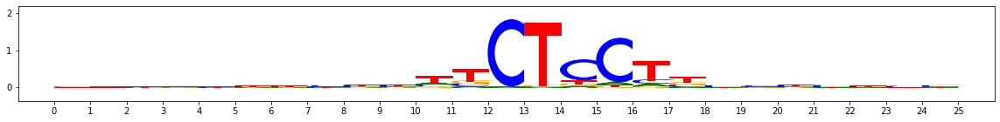

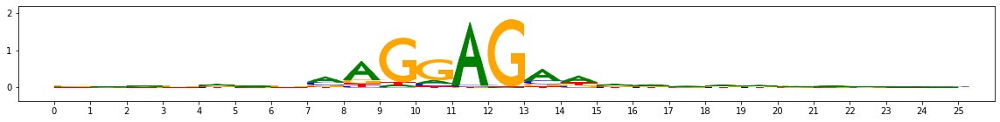

metacluster_0 pattern_15
total seqlets: 307
Task 0 hypothetical scores:


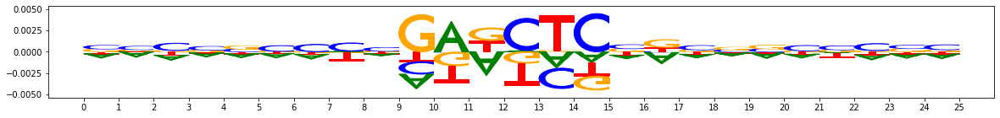

Task 0 actual importance scores:


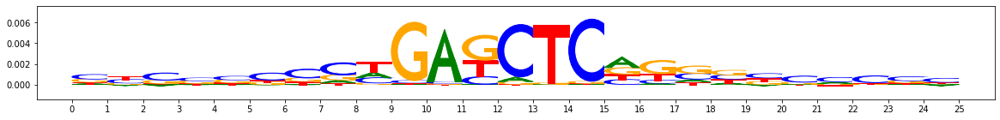

onehot, fwd and rev:


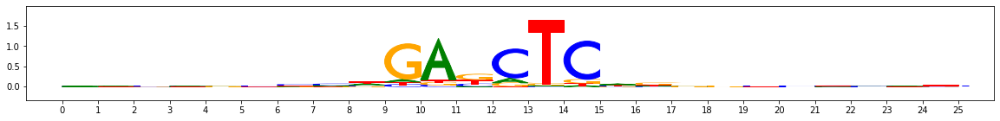

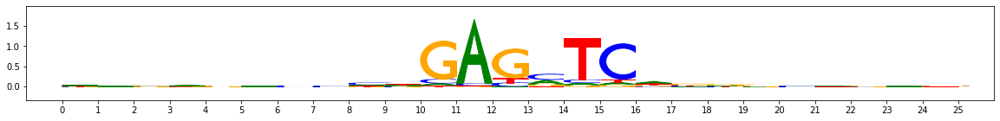

metacluster_0 pattern_16
total seqlets: 304
Task 0 hypothetical scores:


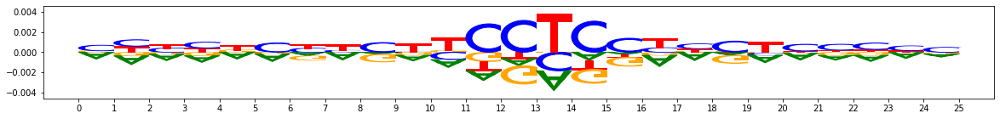

Task 0 actual importance scores:


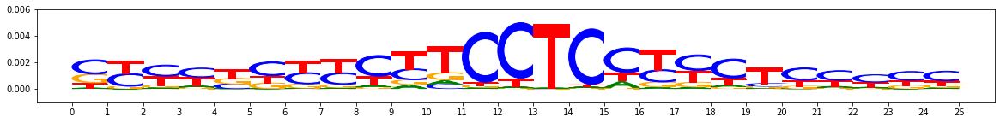

onehot, fwd and rev:


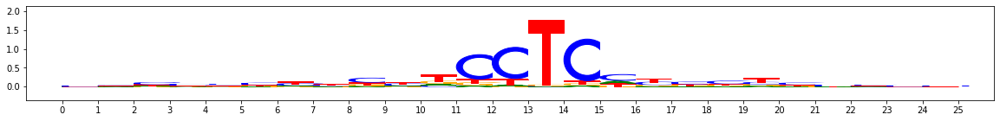

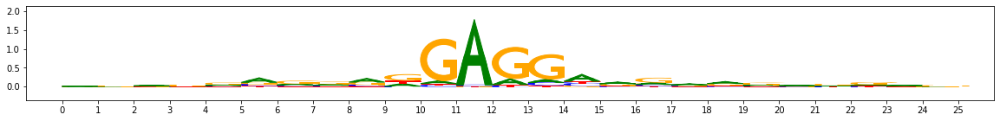

metacluster_0 pattern_17
total seqlets: 295
Task 0 hypothetical scores:


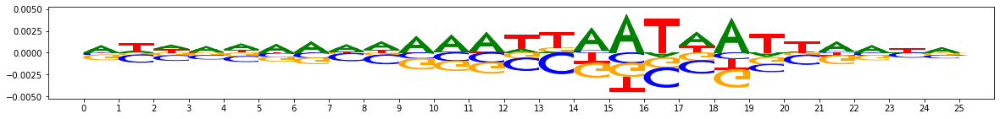

Task 0 actual importance scores:


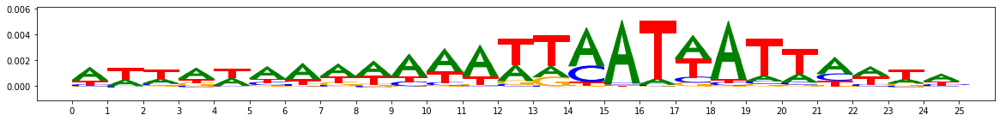

onehot, fwd and rev:


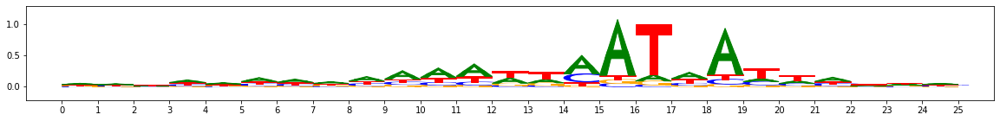

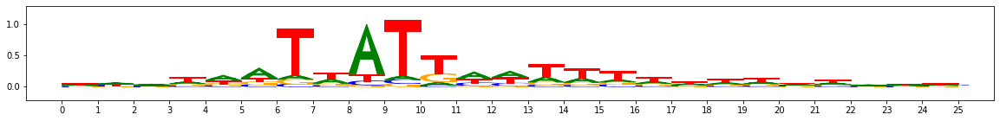

metacluster_0 pattern_18
total seqlets: 289
Task 0 hypothetical scores:


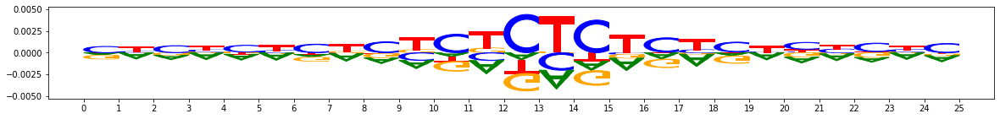

Task 0 actual importance scores:


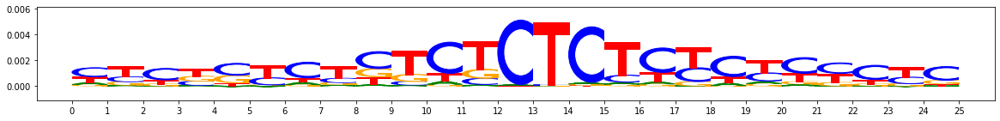

onehot, fwd and rev:


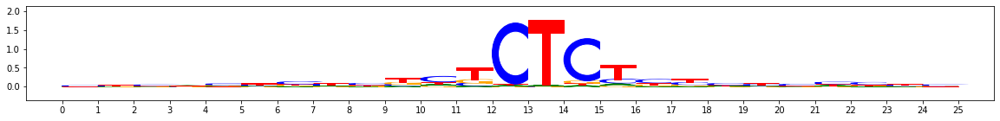

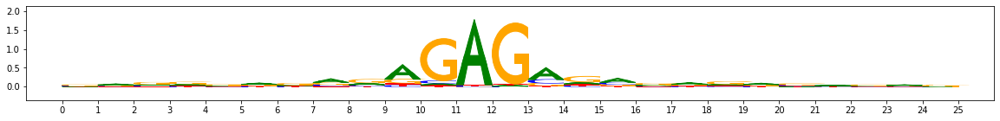

metacluster_0 pattern_19
total seqlets: 263
Task 0 hypothetical scores:


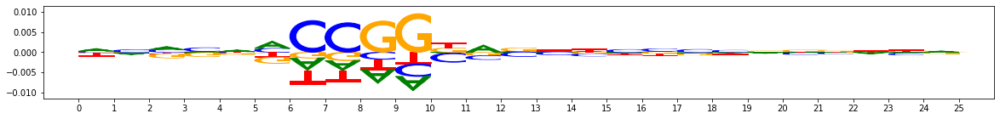

Task 0 actual importance scores:


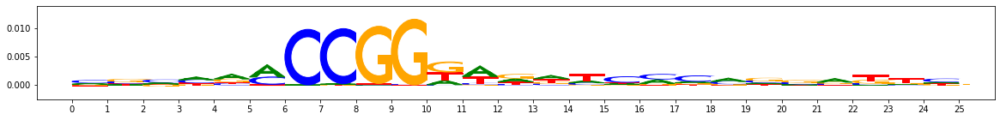

onehot, fwd and rev:


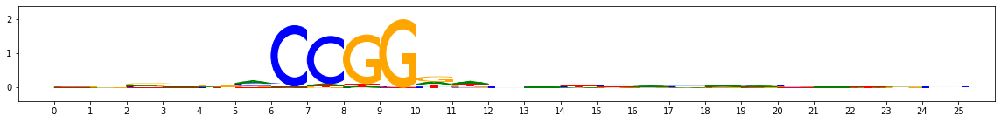

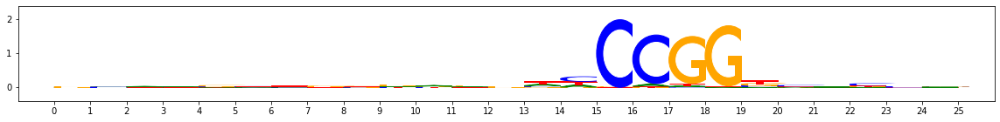

metacluster_0 pattern_20
total seqlets: 237
Task 0 hypothetical scores:


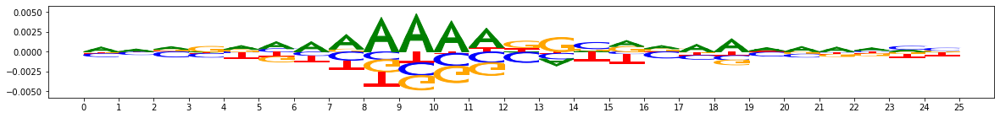

Task 0 actual importance scores:


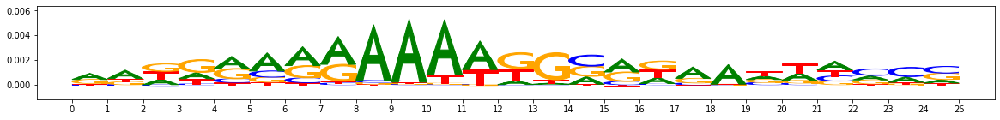

onehot, fwd and rev:


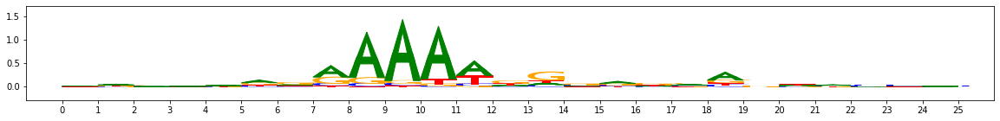

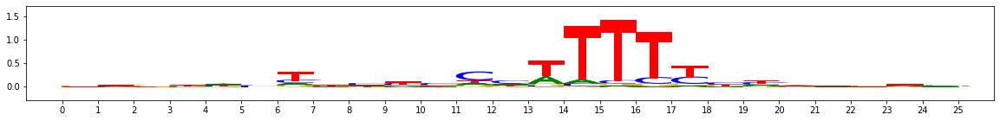

metacluster_0 pattern_21
total seqlets: 211
Task 0 hypothetical scores:


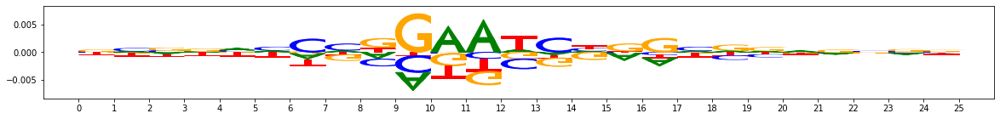

Task 0 actual importance scores:


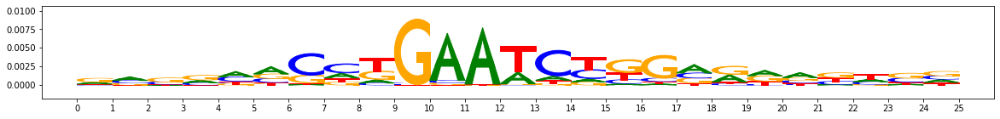

onehot, fwd and rev:


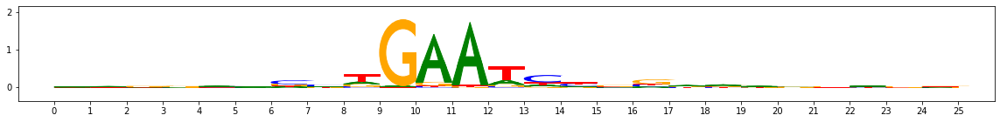

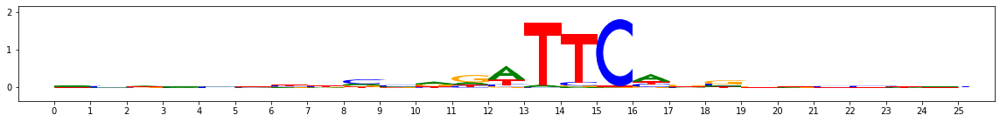

metacluster_0 pattern_22
total seqlets: 186
Task 0 hypothetical scores:


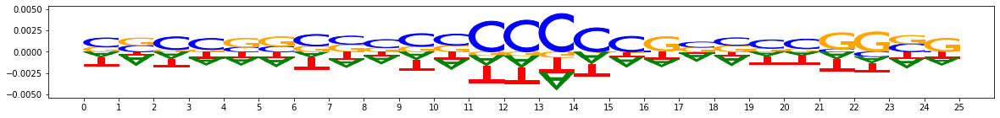

Task 0 actual importance scores:


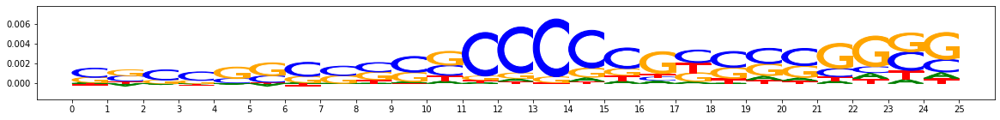

onehot, fwd and rev:


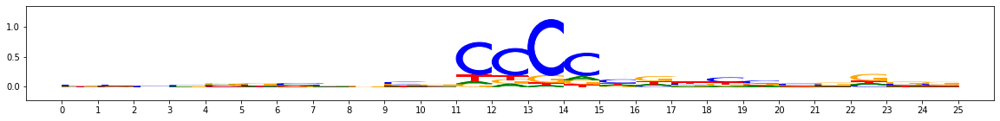

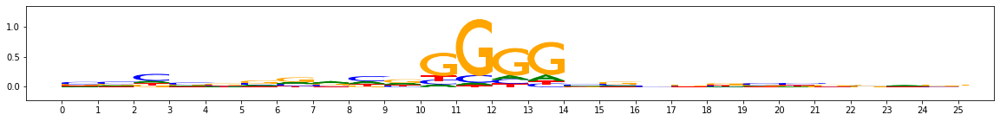

metacluster_0 pattern_23
total seqlets: 152
Task 0 hypothetical scores:


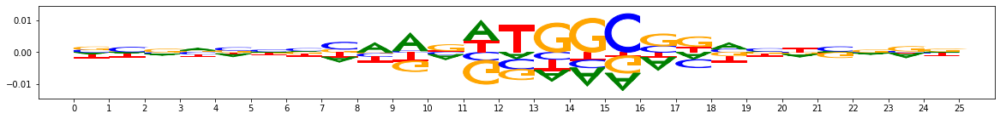

Task 0 actual importance scores:


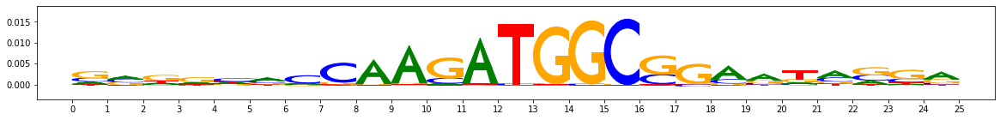

onehot, fwd and rev:


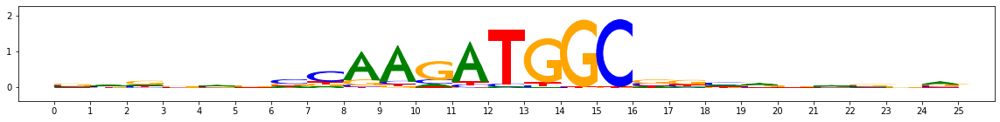

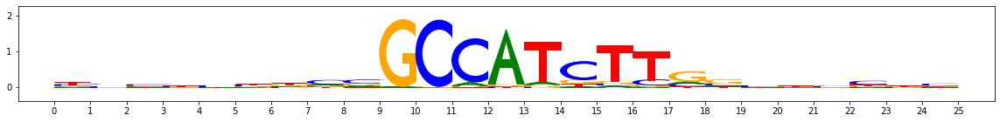

metacluster_0 pattern_24
total seqlets: 114
Task 0 hypothetical scores:


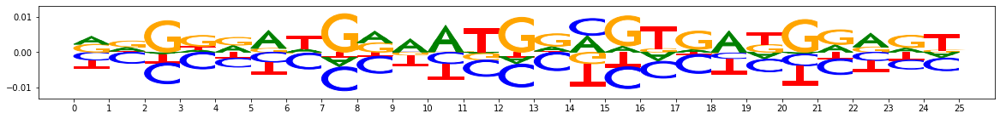

Task 0 actual importance scores:


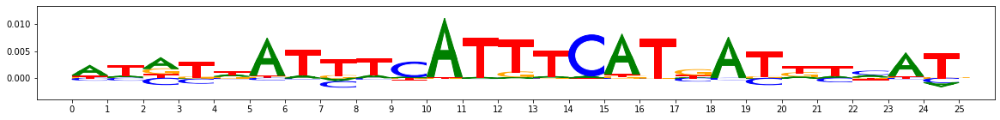

onehot, fwd and rev:


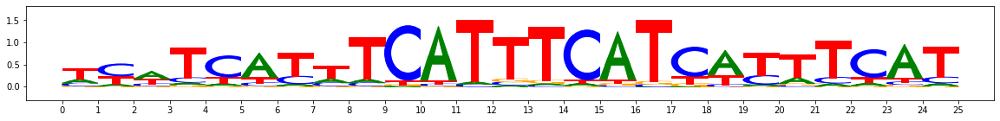

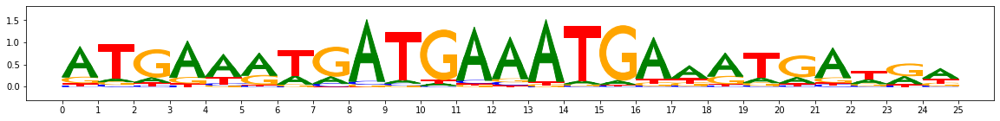

metacluster_0 pattern_25
total seqlets: 113
Task 0 hypothetical scores:


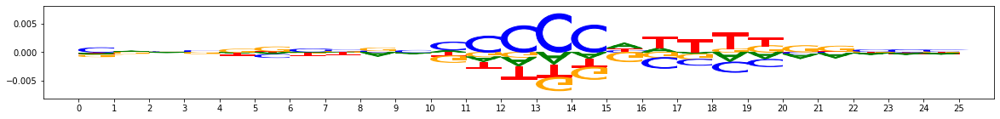

Task 0 actual importance scores:


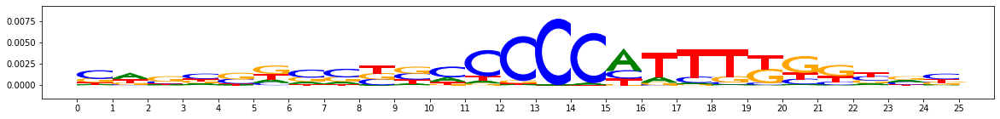

onehot, fwd and rev:


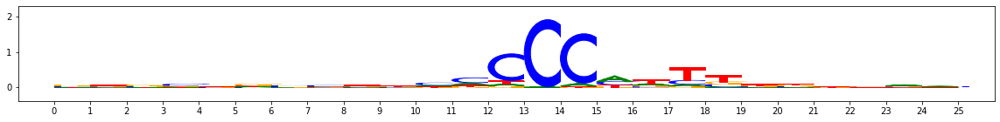

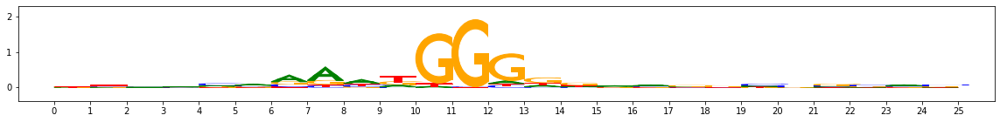

metacluster_0 pattern_26
total seqlets: 99
Task 0 hypothetical scores:


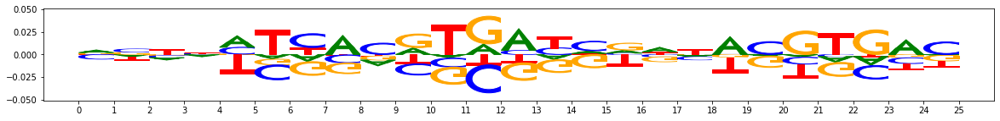

Task 0 actual importance scores:


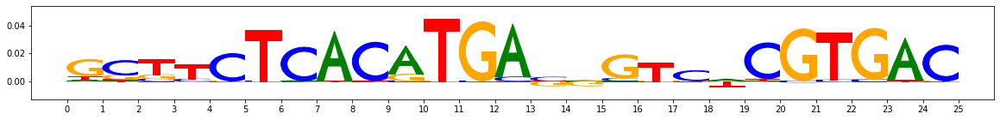

onehot, fwd and rev:


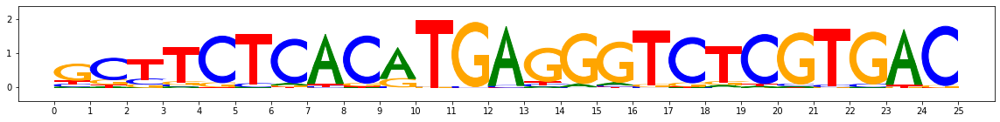

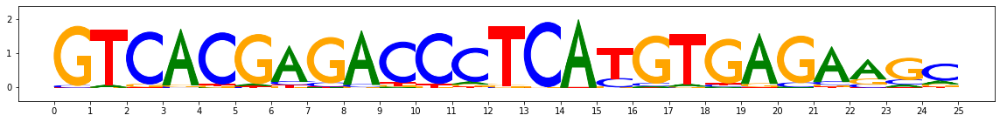

metacluster_0 pattern_27
total seqlets: 96
Task 0 hypothetical scores:


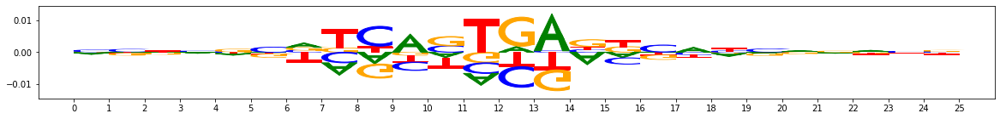

Task 0 actual importance scores:


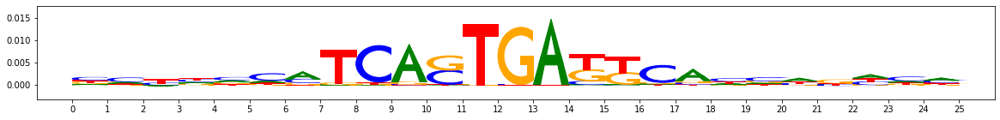

onehot, fwd and rev:


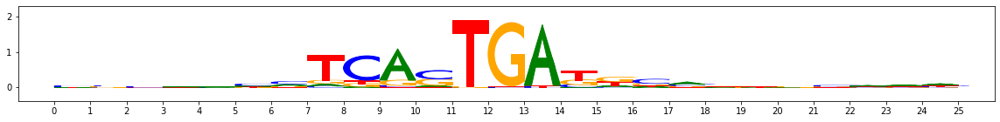

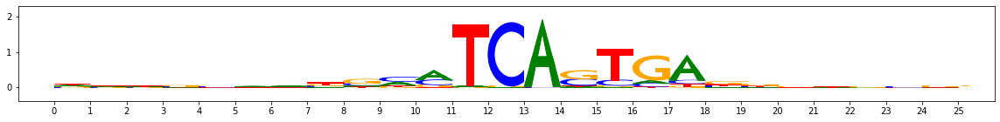

metacluster_0 pattern_28
total seqlets: 94
Task 0 hypothetical scores:


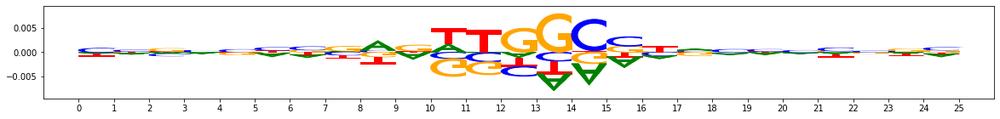

Task 0 actual importance scores:


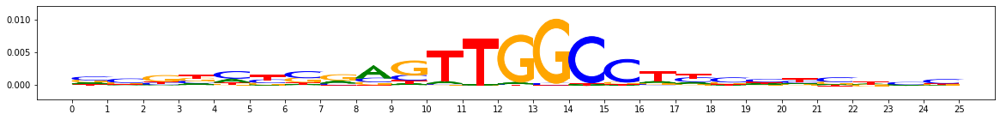

onehot, fwd and rev:


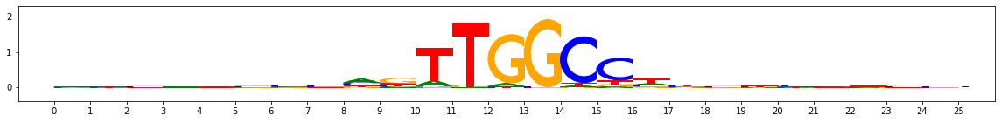

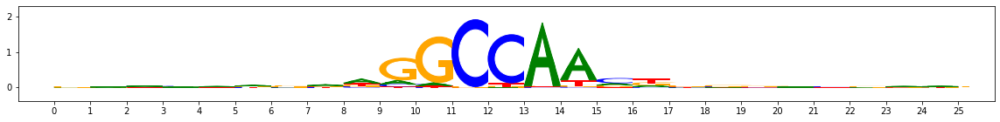

metacluster_0 pattern_29
total seqlets: 93
Task 0 hypothetical scores:


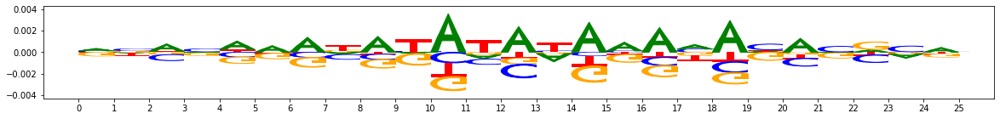

Task 0 actual importance scores:


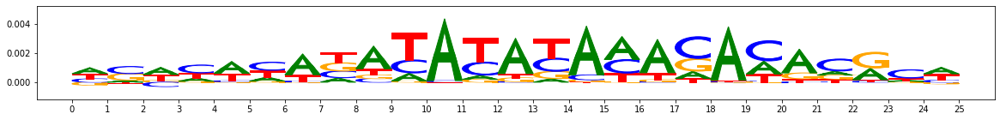

onehot, fwd and rev:


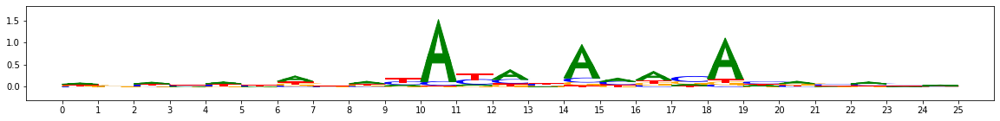

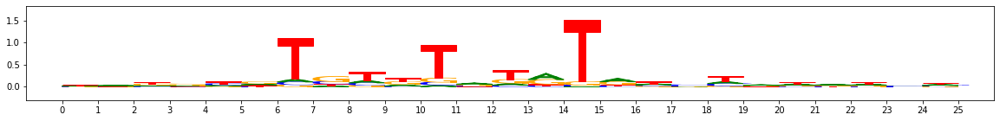

metacluster_0 pattern_30
total seqlets: 90
Task 0 hypothetical scores:


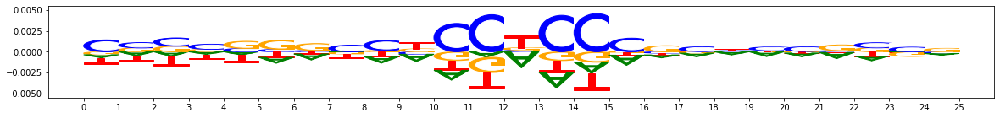

Task 0 actual importance scores:


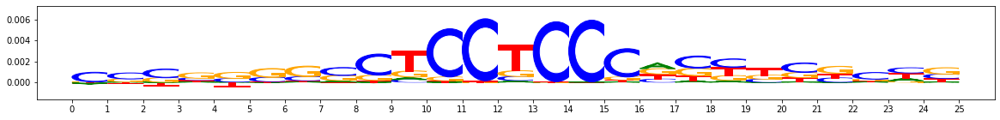

onehot, fwd and rev:


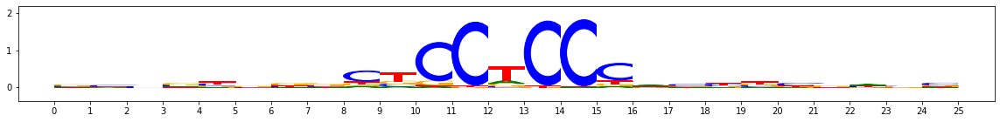

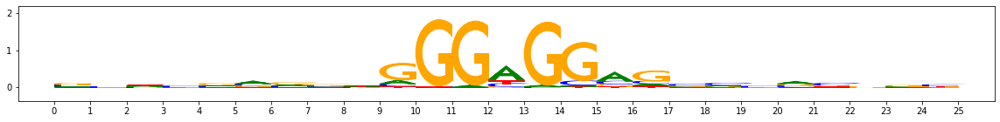

metacluster_0 pattern_31
total seqlets: 83
Task 0 hypothetical scores:


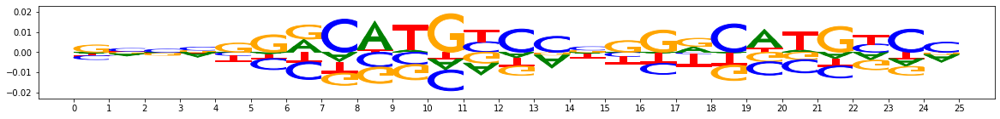

Task 0 actual importance scores:


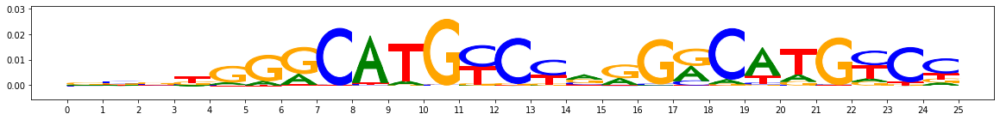

onehot, fwd and rev:


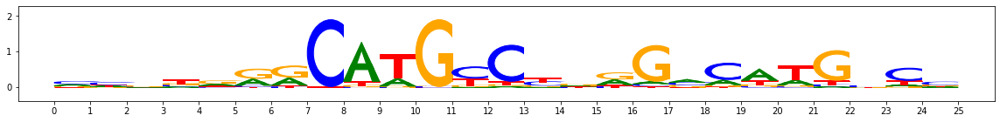

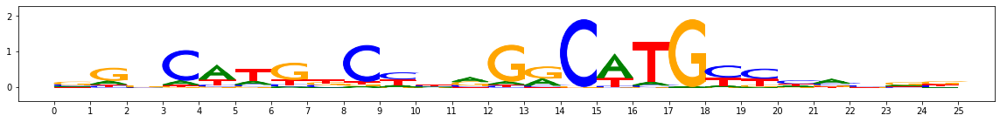

metacluster_0 pattern_32
total seqlets: 81
Task 0 hypothetical scores:


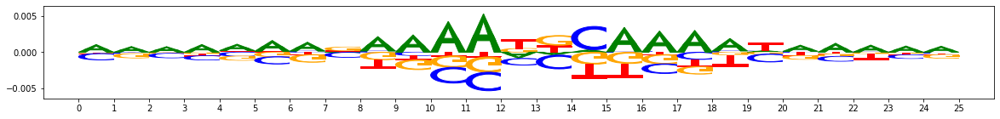

Task 0 actual importance scores:


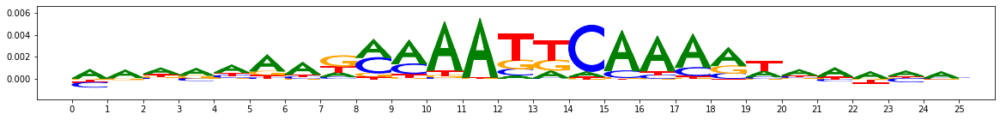

onehot, fwd and rev:


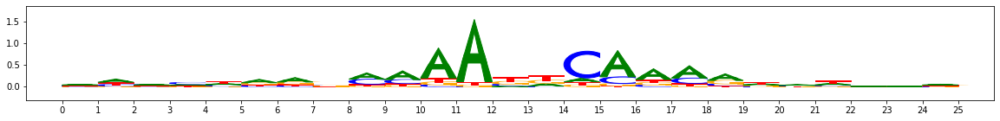

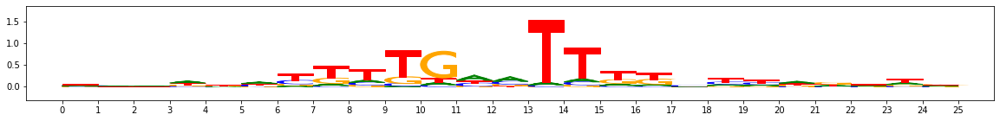

metacluster_0 pattern_33
total seqlets: 77
Task 0 hypothetical scores:


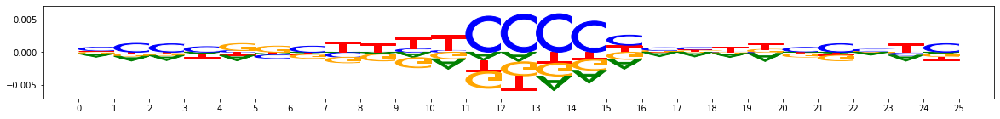

Task 0 actual importance scores:


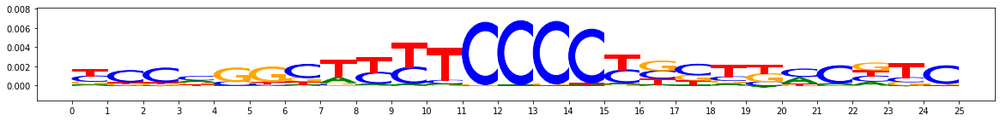

onehot, fwd and rev:


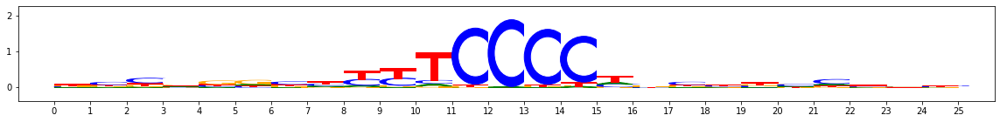

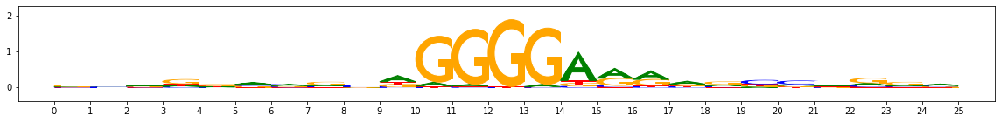

metacluster_0 pattern_34
total seqlets: 76
Task 0 hypothetical scores:


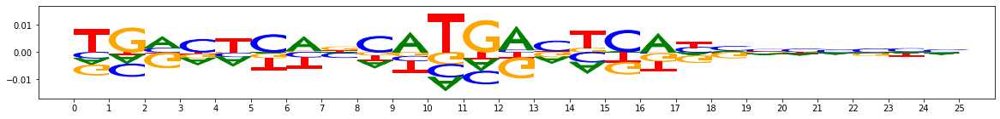

Task 0 actual importance scores:


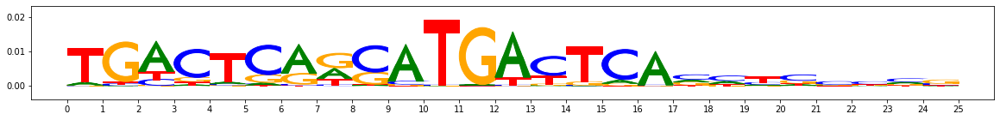

onehot, fwd and rev:


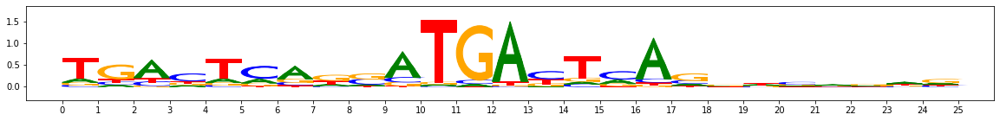

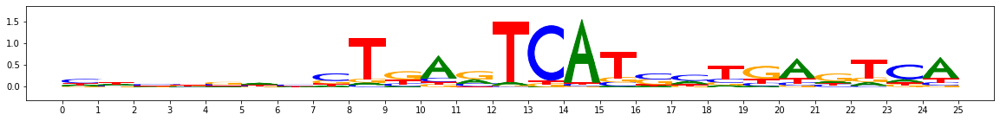

metacluster_0 pattern_35
total seqlets: 74
Task 0 hypothetical scores:


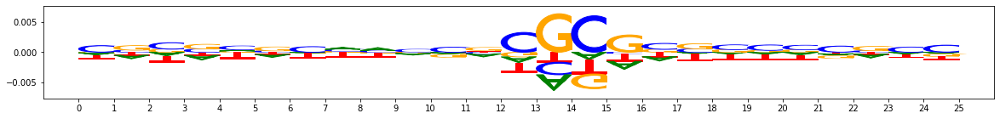

Task 0 actual importance scores:


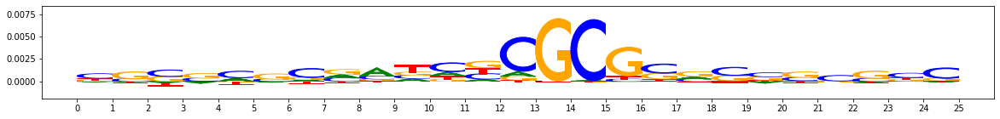

onehot, fwd and rev:


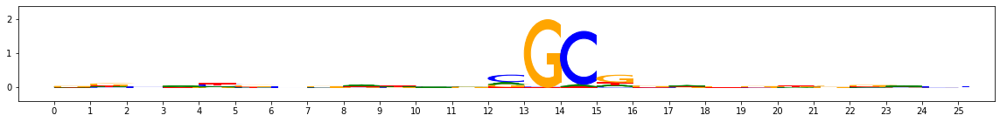

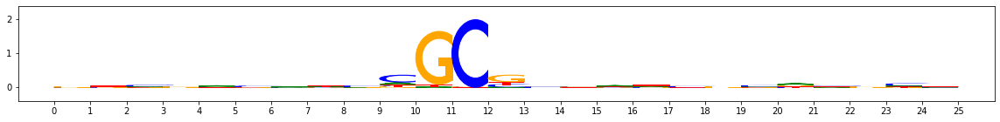

metacluster_0 pattern_36
total seqlets: 72
Task 0 hypothetical scores:


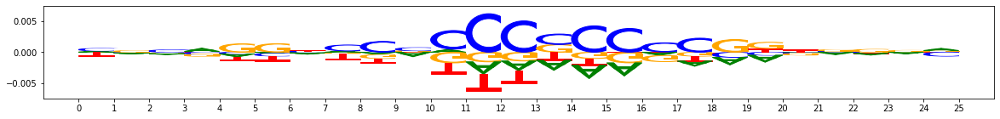

Task 0 actual importance scores:


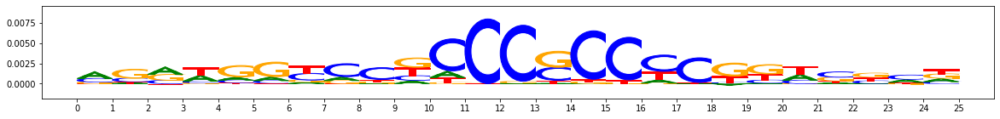

onehot, fwd and rev:


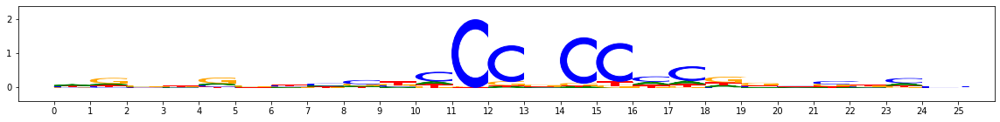

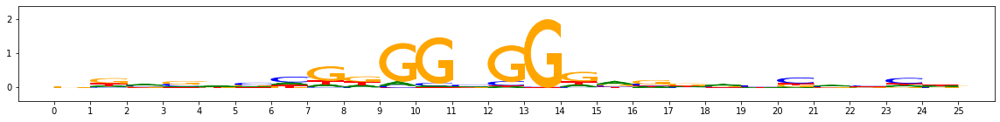

metacluster_0 pattern_37
total seqlets: 69
Task 0 hypothetical scores:


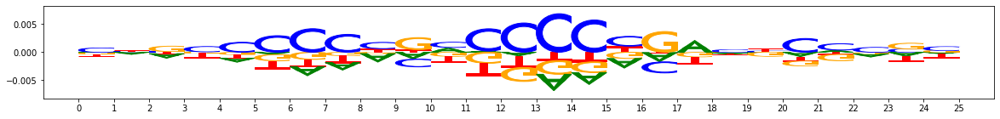

Task 0 actual importance scores:


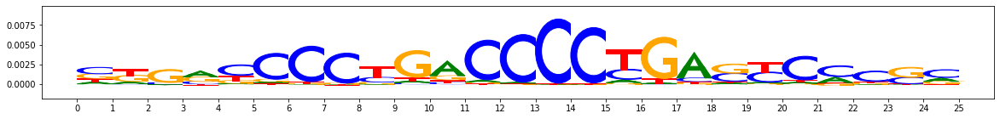

onehot, fwd and rev:


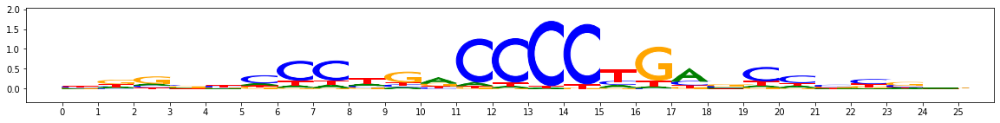

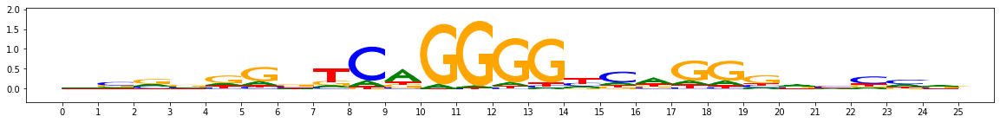

metacluster_0 pattern_38
total seqlets: 67
Task 0 hypothetical scores:


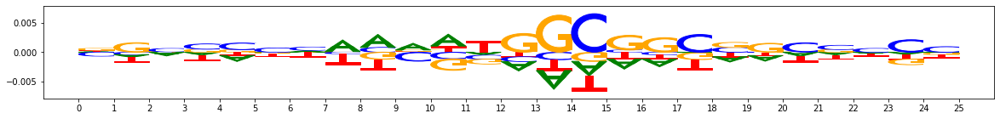

Task 0 actual importance scores:


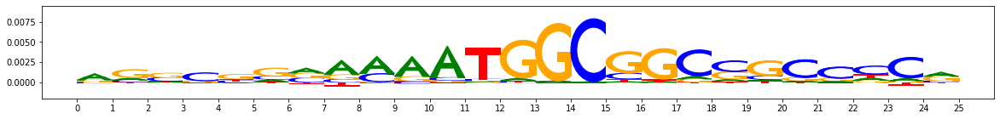

onehot, fwd and rev:


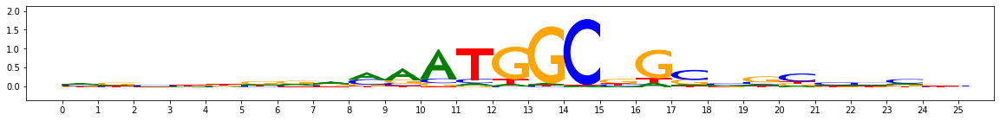

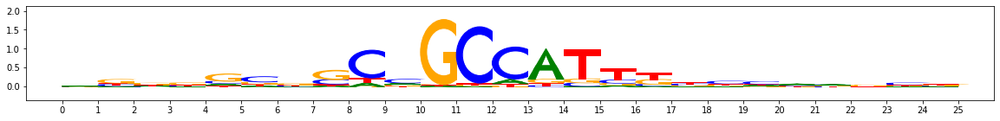

metacluster_0 pattern_39
total seqlets: 66
Task 0 hypothetical scores:


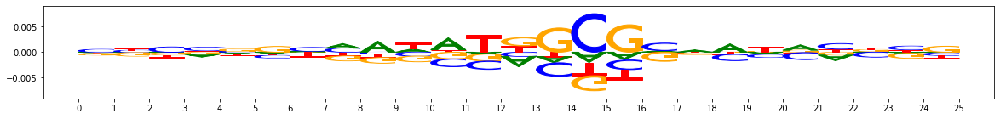

Task 0 actual importance scores:


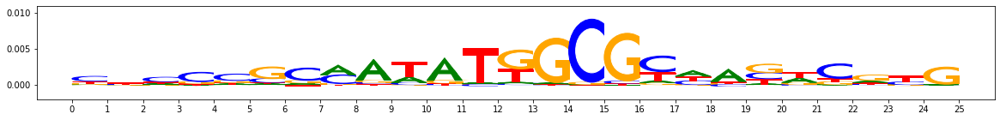

onehot, fwd and rev:


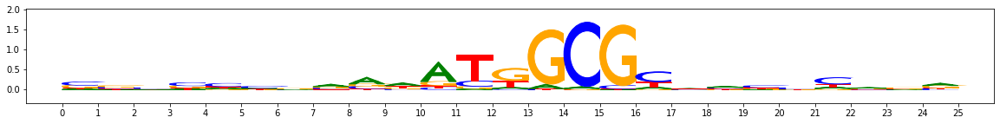

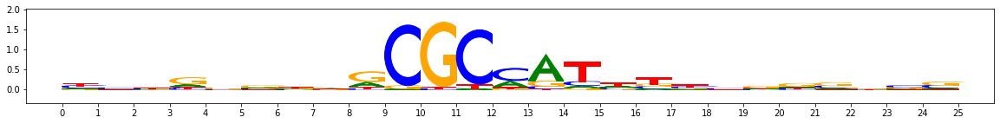

metacluster_0 pattern_40
total seqlets: 62
Task 0 hypothetical scores:


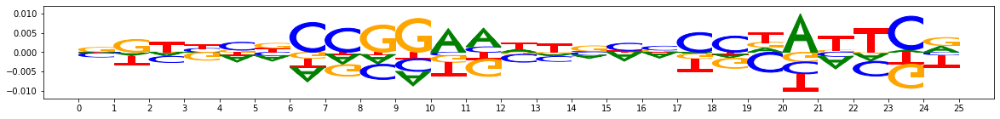

Task 0 actual importance scores:


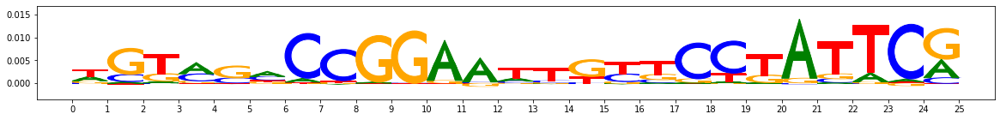

onehot, fwd and rev:


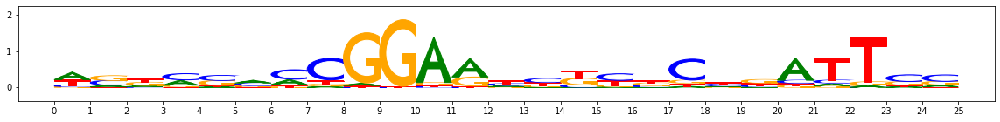

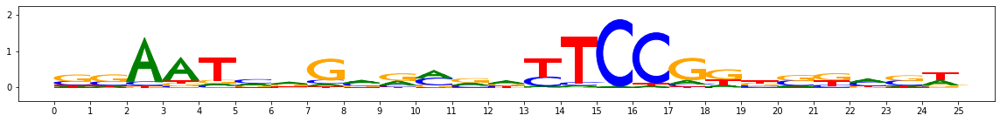

metacluster_0 pattern_41
total seqlets: 42
Task 0 hypothetical scores:


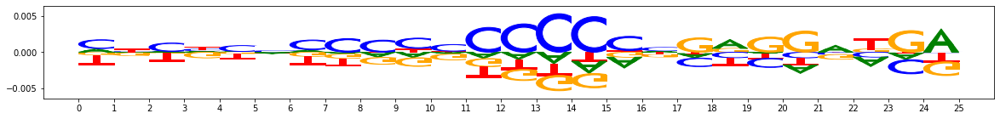

Task 0 actual importance scores:


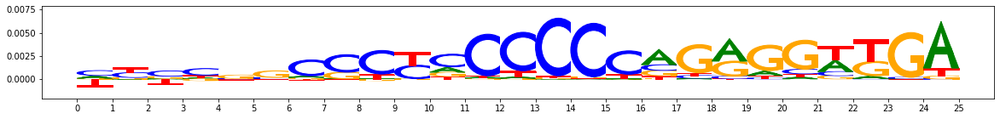

onehot, fwd and rev:


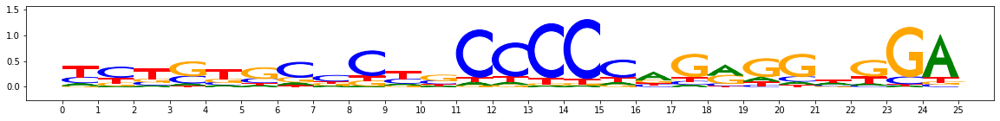

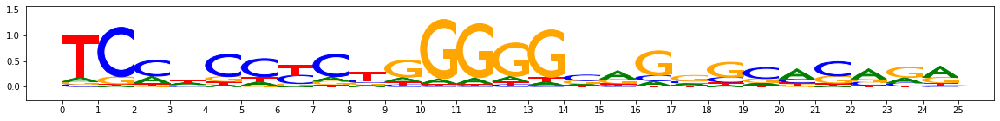

metacluster_0 pattern_42
total seqlets: 41
Task 0 hypothetical scores:


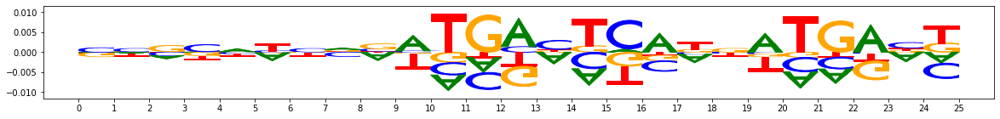

Task 0 actual importance scores:


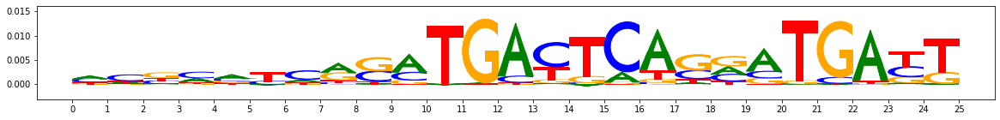

onehot, fwd and rev:


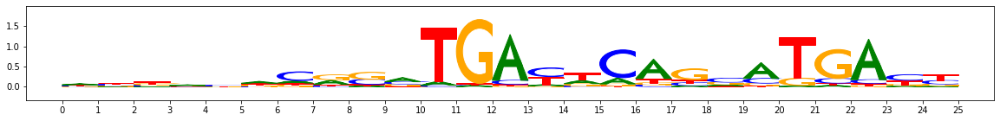

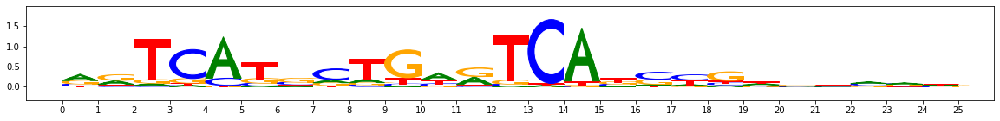

metacluster_0 pattern_43
total seqlets: 36
Task 0 hypothetical scores:


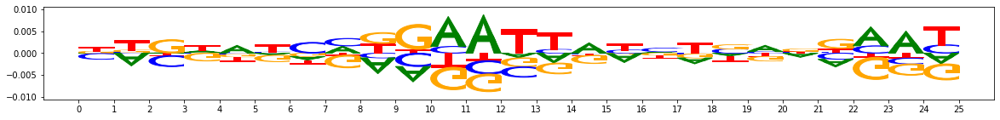

Task 0 actual importance scores:


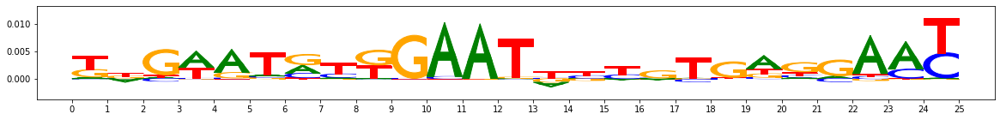

onehot, fwd and rev:


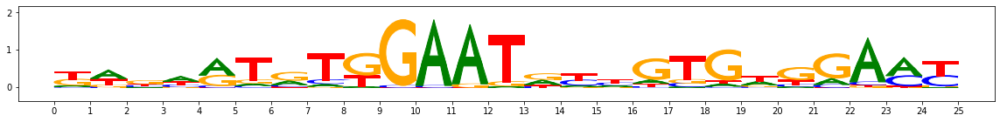

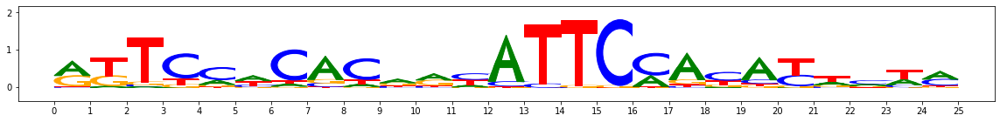

metacluster_0 pattern_44
total seqlets: 34
Task 0 hypothetical scores:


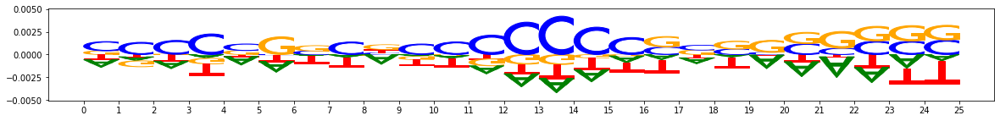

Task 0 actual importance scores:


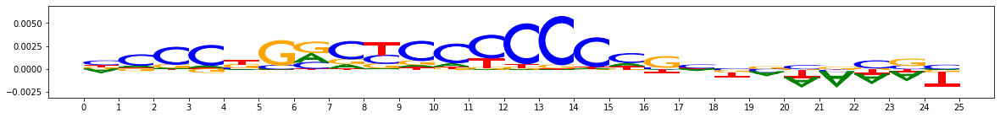

onehot, fwd and rev:


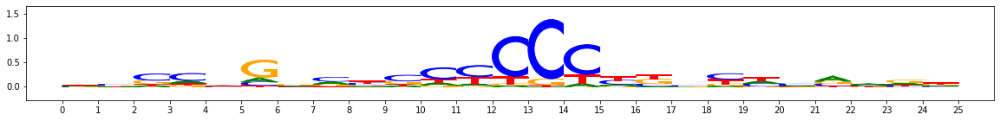

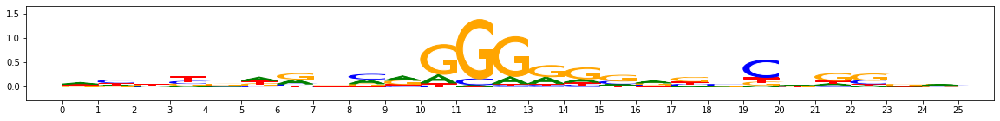

metacluster_0 pattern_45
total seqlets: 25
Task 0 hypothetical scores:


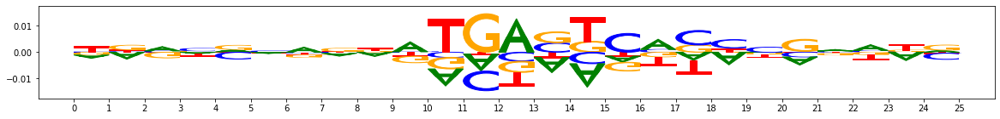

Task 0 actual importance scores:


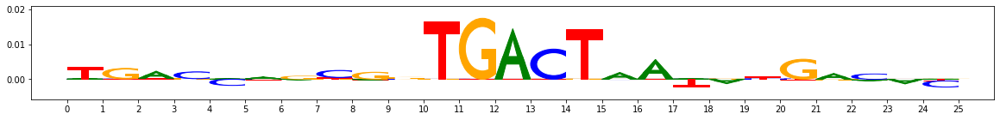

onehot, fwd and rev:


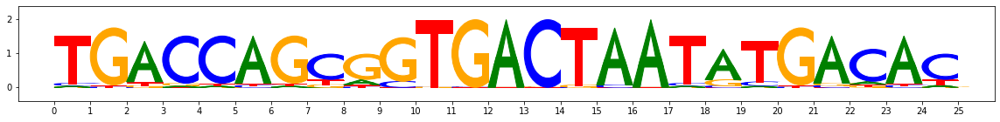

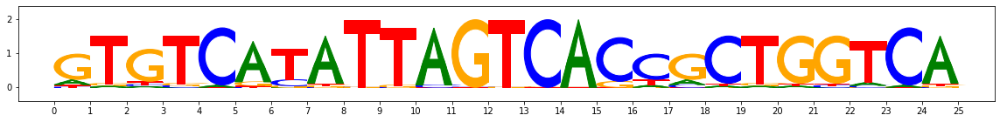

metacluster_0 pattern_46
total seqlets: 23
Task 0 hypothetical scores:


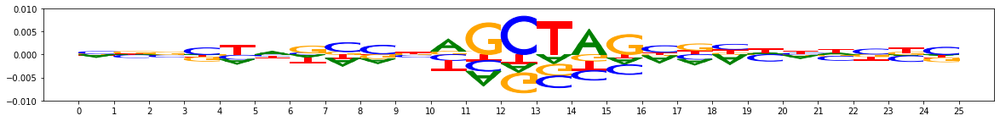

Task 0 actual importance scores:


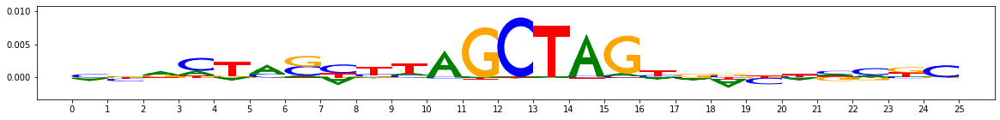

onehot, fwd and rev:


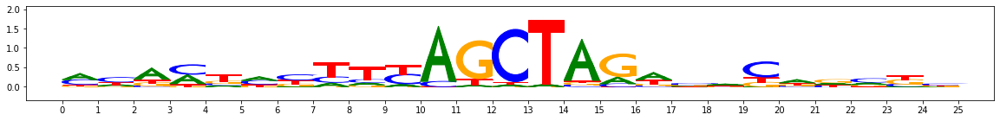

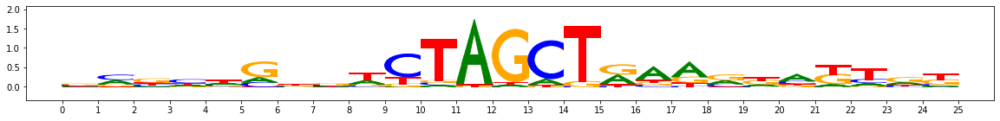

metacluster_1
activity pattern: [-1]


In [ ]:
inspect_motifs(output_file, onehot_data, task_num=0, activity_pattern_to_plot=1)

In [ ]:
meme_output = f'../data/output_data/A549_rep1rep2_regression.meme'
output_meme(output_file, onehot_data, activity_pattern_to_plot=1, meme_output=meme_output)

metacluster_0
activity pattern: [1]
metacluster_0 pattern_0
total seqlets: 2297
metacluster_0 pattern_1
total seqlets: 1438
metacluster_0 pattern_2
total seqlets: 1023
metacluster_0 pattern_3
total seqlets: 869
metacluster_0 pattern_4
total seqlets: 729
metacluster_0 pattern_5
total seqlets: 619
metacluster_0 pattern_6
total seqlets: 611
metacluster_0 pattern_7
total seqlets: 521
metacluster_0 pattern_8
total seqlets: 491
metacluster_0 pattern_9
total seqlets: 479
metacluster_0 pattern_10
total seqlets: 435
metacluster_0 pattern_11
total seqlets: 418
metacluster_0 pattern_12
total seqlets: 386
metacluster_0 pattern_13
total seqlets: 351
metacluster_0 pattern_14
total seqlets: 348
metacluster_0 pattern_15
total seqlets: 307
metacluster_0 pattern_16
total seqlets: 304
metacluster_0 pattern_17
total seqlets: 295
metacluster_0 pattern_18
total seqlets: 289
metacluster_0 pattern_19
total seqlets: 263
metacluster_0 pattern_20
total seqlets: 237
metacluster_0 pattern_21
total seqlets: 211
met